# Multichannel Tryout for 488

In [2]:
from __future__ import annotations
import time
import tkinter
import pathlib
import pickle
import tifffile
import os
import numpy as np
from PIL import (Image, ImageTk, ImageDraw)
from tkinter import filedialog, messagebox
from matplotlib.figure import Figure 
from matplotlib.backends.backend_tkagg import (FigureCanvasTkAgg, NavigationToolbar2Tk)
from matplotlib.patches import Rectangle, Circle
from matplotlib.backend_bases import MouseEvent
from matplotlib.path import Path
from matplotlib.patches import PathPatch
import matplotlib.pyplot as plt
from skimage import measure
import fishCore
import fishGUI
import threading
import concurrent.futures
import cv2
import imageio.v3 as iio
import napari
from aicsimageio import AICSImage

f = fishCore.Fish(pathlib.Path("./config.ini"))
f.set_model_version("3.50")

final text_encoder_type: bert-base-uncased


[2025-08-20 14:41:18,777][INFO] CHECK: Model version 3.50 loaded


## Testing Filters w/ Watershed Segmentation

Estimated Gaussian noise standard deviation = 1.7238518729698984
Estimated Gaussian noise standard deviation = 7.698263550937639


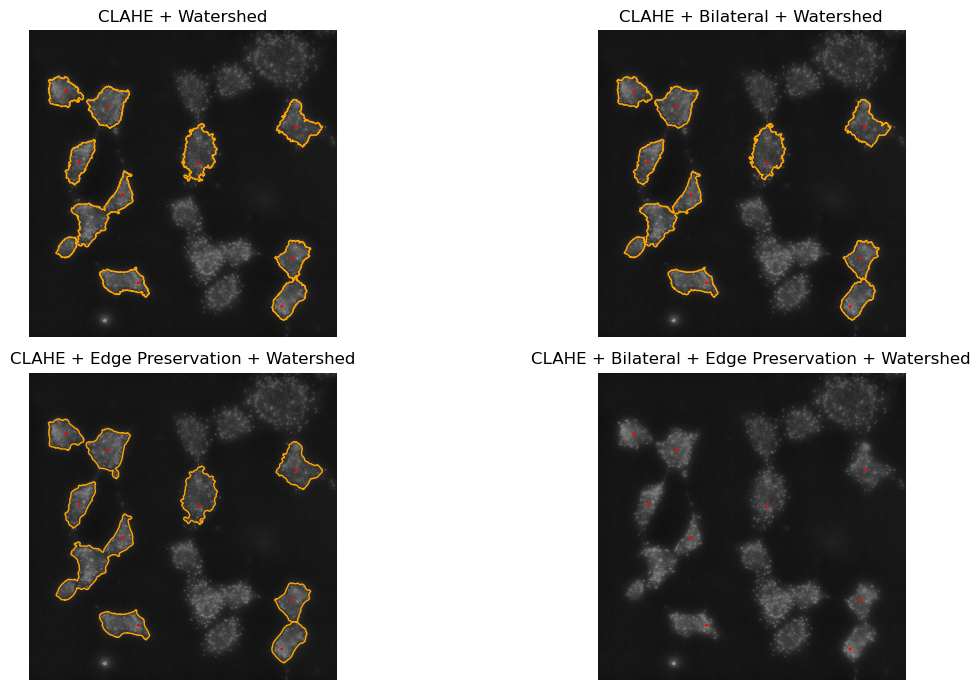

In [3]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
from skimage.restoration import (
    denoise_tv_chambolle,
    denoise_bilateral,
    denoise_wavelet,
    estimate_sigma,
)
import pathlib

# --------------------------------------
# Helper functions
# --------------------------------------

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def watershed_segment(cyt_img: np.ndarray,
                      centers: list[tuple[float,float]],
                      thresh_method: str = "otsu",
                      min_size: int = 300) -> list[np.ndarray]:
    if thresh_method == "otsu":
        thresh = filters.threshold_otsu(cyt_img)
    else:
        thresh = np.percentile(cyt_img, 30)
    
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    binary = morphology.remove_small_objects(binary, min_size=1000)

    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for idx, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = idx

    labels = segmentation.watershed(-dist, markers, mask=binary)

    masks = []
    for i in range(1, len(centers)+1):
        cell = (labels == i)
        cell = postproc_mask(cell)
        masks.append(cell)
    return masks

# --------------------------------------
# Load image and preprocess
# --------------------------------------

image_path = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\kayleigh_composite\488_pb5sp5_s5.composite.tif"

with tifffile.TiffFile(image_path) as tif:
    ch = tif.pages[0].asarray() # testing with 488
    nucleus = tif.pages[1].asarray()

ch = normalize_to_uint8(ch)

# ----- ESTIMATE SIGMA - Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
sigma_est = estimate_sigma(ch, channel_axis=-1, average_sigmas=True)
print(f'Estimated Gaussian noise standard deviation = {sigma_est}')

clahe = clahe_filter(ch)
# grad = gradient(clahe)

# ----- ESTIMATE SIGMA - Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
sigma_est = estimate_sigma(clahe, channel_axis=-1, average_sigmas=True)
print(f'Estimated Gaussian noise standard deviation = {sigma_est}')

sigma_norm = sigma_est + 3.0
sigma_weak = sigma_est - 10.0

bilat1 = cv2.bilateralFilter(clahe, d=9, sigmaColor=sigma_norm, sigmaSpace=sigma_norm, borderType=cv2.BORDER_REFLECT_101)
edge_preserved = cv2.edgePreservingFilter(clahe, flags=1, sigma_s=sigma_norm, sigma_r=0.4)

bilat_edge = cv2.edgePreservingFilter(bilat1, flags=1, sigma_s=sigma_weak, sigma_r=0.4)

laplacian = cv2.Laplacian(ch, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)
blended = cv2.addWeighted(bilat1, 0.8, laplacian, 0.2, 0)

# ----- BBoxes and Masks -----
bbox_nucleus = f.AppIntDINOwrapper(nucleus)
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

masks_clahe = watershed_segment(clahe, centers)
# masks_grad = watershed_segment(grad, centers)
masks_bilat = watershed_segment(bilat1, centers)
masks_edge_preserved = watershed_segment(edge_preserved, centers)
masks_bilat_edge = watershed_segment(bilat_edge, centers)

# --------------------------------------
# Visualization
# --------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 7))

### ALL HAVE WATERSHED 


# CLAHE filter only
axes[0, 0].imshow(clahe, cmap='gray')
axes[0, 0].set_title("CLAHE + Watershed")
axes[0, 0].axis('off')
for mask in masks_clahe:
    for contour in measure.find_contours(mask, 0.5):
        axes[0, 0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
for cx, cy in centers:
    axes[0, 0].add_patch(Circle((cx, cy), radius=5, color='red', fill=True))

# CLAHE + Bilateral 
axes[0, 1].imshow(clahe, cmap='gray')
axes[0, 1].set_title("CLAHE + Bilateral + Watershed")
axes[0, 1].axis('off')
for mask in masks_bilat:
    for contour in measure.find_contours(mask, 0.5):
        axes[0, 1].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
for cx, cy in centers:
    axes[0, 1].add_patch(Circle((cx, cy), radius=5, color='red', fill=True))

# CLAHE + Edge Preservation
axes[1, 0].imshow(clahe, cmap='gray')
axes[1, 0].set_title("CLAHE + Edge Preservation + Watershed")
axes[1, 0].axis('off')
for mask in masks_edge_preserved:
    for contour in measure.find_contours(mask, 0.5):
        axes[1, 0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
for cx, cy in centers:
    axes[1, 0].add_patch(Circle((cx, cy), radius=5, color='red', fill=True))

# CLAHE + Bilateral + Edge Preservation
axes[1, 1].imshow(clahe, cmap='gray')
axes[1, 1].set_title("CLAHE + Bilateral + Edge Preservation + Watershed")
axes[1, 1].axis('off')
for mask in masks_bilat_edge:
    for contour in measure.find_contours(mask, 0.5):
        axes[1, 1].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
for cx, cy in centers:
    axes[1, 1].add_patch(Circle((cx, cy), radius=5, color='red', fill=True))

plt.tight_layout()
plt.show()

## Testing w/ Filters + Watershed-Guided Sam

Estimated Gaussian noise standard deviation = 5.597034263410098
Estimated Gaussian noise standard deviation = 24.873763386225665
[CYTO] Starting prediction for 18 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [1419.0, 41.0, 1873.0, 385.0]
[CYTO] Processing box [908.0, 1099.0, 1160.0, 1352.0]
[CYTO] Processing box [1647.0, 526.0, 1949.0, 767.0]
[CYTO] Processing box [492.0, 938.0, 693.0, 1219.0]
[CYTO] Processing box [1249.0, 246.0, 1482.0, 446.0]
[CYTO] Processing box [243.0, 725.0, 443.0, 1016.0]
[CYTO] Processing box [128.0, 298.0, 368.0, 521.0]
[CYTO] Processing box [462.0, 1576.0, 808.0, 1774.0]
[CYTO] Processing box [1623.0, 1630.0, 1852.0, 1922.0]
[CYTO] Processing box [282.0, 1134.0, 536.0, 1425.0]
[CYTO] Processing box [1232.0, 1380.0, 1486.0, 1595.0]
[CYTO] Processing box [387.0, 367.0, 677.0, 652.0]
[CYTO] Processing box [972.0, 269.0, 1194.0, 566.0]
[CYTO] Processing box [1166.0, 1623.0, 

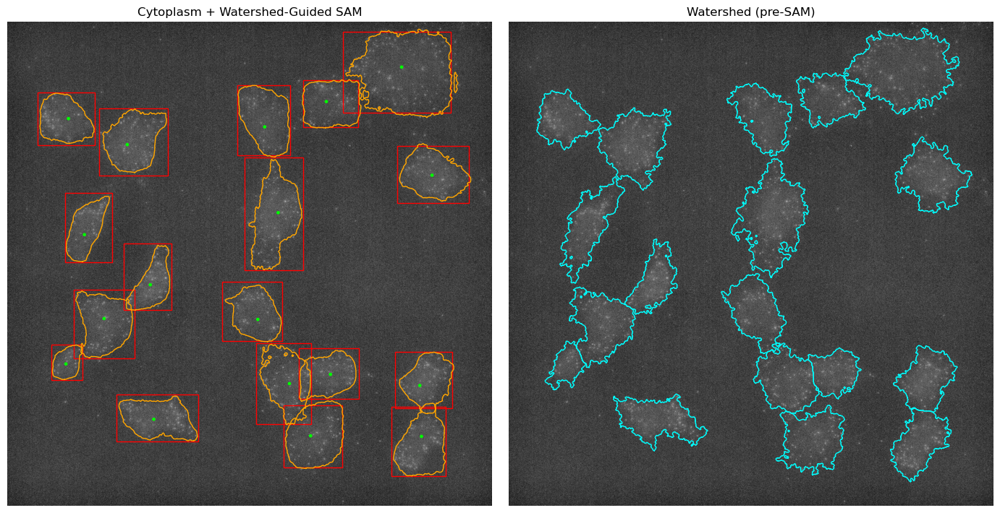

In [4]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
import pathlib

# --------------------------------------
# Helper functions
# --------------------------------------

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def gradient(channel, ksize=5):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
    return cv2.morphologyEx(channel, cv2.MORPH_GRADIENT, kernel)

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_closing(m, footprint=morphology.disk(3))
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def mask_to_bbox(mask):
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None
    return (xs.min(), ys.min(), xs.max(), ys.max())

def watershed_segment_with_centers(cyt_img, centers):
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    binary = morphology.remove_small_objects(binary, min_size=1000)
    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    edges = filters.sobel(cyt_img)
    elevation = -dist + 5 * edges
    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels)+1):
        mask = (labels == i)
        if np.sum(mask) > 0:
            masks.append(postproc_mask(mask))
    return masks

# --------------------------------------
# Load image and preprocess
# --------------------------------------


with tifffile.TiffFile(image_path) as tif:
    ch = tif.pages[1].asarray() # testing with 488
    nucleus = tif.pages[2].asarray()

ch = normalize_to_uint8(ch)

# ----- ESTIMATE SIGMA - Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
sigma_est = estimate_sigma(ch, channel_axis=-1, average_sigmas=True)
print(f'Estimated Gaussian noise standard deviation = {sigma_est}')

cyt_clahe = clahe_filter(ch)


# cyt_clahe = clahe_filter(ch)
# cyt_grad = gradient(clahe)

# ----- ESTIMATE SIGMA - Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
sigma_est = estimate_sigma(cyt_clahe, channel_axis=-1, average_sigmas=True)
print(f'Estimated Gaussian noise standard deviation = {sigma_est}')

sigma_norm = sigma_est + 3.0
sigma_weak = sigma_est - 10.0

cyt_bilat = cv2.bilateralFilter(cyt_clahe, d=9, sigmaColor=sigma_norm, sigmaSpace=15, borderType=cv2.BORDER_REFLECT_101)
cyt_edge_preserved = cv2.edgePreservingFilter(cyt_clahe, flags=1, sigma_s=sigma_norm, sigma_r=0.4)

cyt_grad = gradient(cyt_bilat)
cyt_bilat_edge = cv2.edgePreservingFilter(cyt_bilat, flags=1, sigma_s=sigma_weak, sigma_r=0.4)

laplacian = cv2.Laplacian(ch, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)
cyt_blended = cv2.addWeighted(cyt_bilat, 0.8, laplacian, 0.2, 0)

# --------
# Stacking
# --------
cyt_rgb = np.stack([cyt_blended, cyt_edge_preserved, cyt_bilat_edge], axis=-1)
bbox_nucleus = f.AppIntDINOwrapper(nucleus) 
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

# --- Creating Masks ---
masks_clahe = watershed_segment_with_centers(cyt_clahe, centers)
# masks_grad = watershed_segment(grad, centers)
masks_blended = watershed_segment_with_centers(cyt_blended, centers)
masks_bilat = watershed_segment(cyt_bilat, centers)
masks_edge_preserved = watershed_segment(cyt_edge_preserved, centers)
masks_bilat_edge = watershed_segment(cyt_bilat_edge, centers)

# --- Creating BBoxes ---
bbox_cyto = [mask_to_bbox(m) for m in masks_edge_preserved]
bbox_cyto = [b for b in bbox_cyto if b is not None]
bbox_cyto = [
    [float(x1), float(y1), float(x2), float(y2)] 
    for (x1, y1, x2, y2) in bbox_cyto
]


# -----------------------------
# SAM segmentation guided by boxes
# -----------------------------
masks_all = f.finetune.AppIntPREDICTCytoplasmWrapper(cyt_rgb, bbox_cyto)

masks = []
for mset in masks_all:
    areas = [(mm > 0).sum() for mm in mset]
    best = mset[np.argmax(areas)]
    masks.append(postproc_mask(best))

# --------------------------------------
# Visualization
# --------------------------------------
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

# Cytoplasm + masks
ax[0].imshow(cyt_clahe, cmap='gray')
ax[0].set_title("Cytoplasm + Watershed-Guided SAM")
ax[0].axis('off')
for (x1, y1, x2, y2), (cx, cy) in zip(bbox_cyto, centers):
    ax[0].add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none', lw=1))
    ax[0].add_patch(Circle((cx, cy), radius=5, color='lime', fill=True))
for mask in masks:
    for contour in measure.find_contours(mask, 0.5):
        ax[0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

# RIGHT: Watershed-only (pre-SAM)
ax[1].imshow(cyt_clahe, cmap='gray')
ax[1].set_title("Watershed (pre-SAM)")
ax[1].axis('off')
for wm in masks_clahe:
    for contour in measure.find_contours(wm, 0.5):
        ax[1].plot(contour[:, 1], contour[:, 0], linewidth=1, color='cyan')


plt.tight_layout()
plt.show()

### Checking watershed is working properly

Estimated Gaussian noise standard deviation = 5.597034263410098
Estimated Gaussian noise standard deviation = 24.873763386225665
[CYTO] Starting prediction for 18 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [1419.0, 41.0, 1873.0, 385.0]
[CYTO] Processing box [908.0, 1099.0, 1160.0, 1352.0]
[CYTO] Processing box [1647.0, 526.0, 1949.0, 767.0]
[CYTO] Processing box [492.0, 938.0, 693.0, 1219.0]
[CYTO] Processing box [1249.0, 246.0, 1482.0, 446.0]
[CYTO] Processing box [243.0, 725.0, 443.0, 1016.0]
[CYTO] Processing box [128.0, 298.0, 368.0, 521.0]
[CYTO] Processing box [462.0, 1576.0, 808.0, 1774.0]
[CYTO] Processing box [1623.0, 1630.0, 1852.0, 1922.0]
[CYTO] Processing box [282.0, 1134.0, 536.0, 1425.0]
[CYTO] Processing box [1232.0, 1380.0, 1486.0, 1595.0]
[CYTO] Processing box [387.0, 367.0, 677.0, 652.0]
[CYTO] Processing box [972.0, 269.0, 1194.0, 566.0]
[CYTO] Processing box [1166.0, 1623.0, 

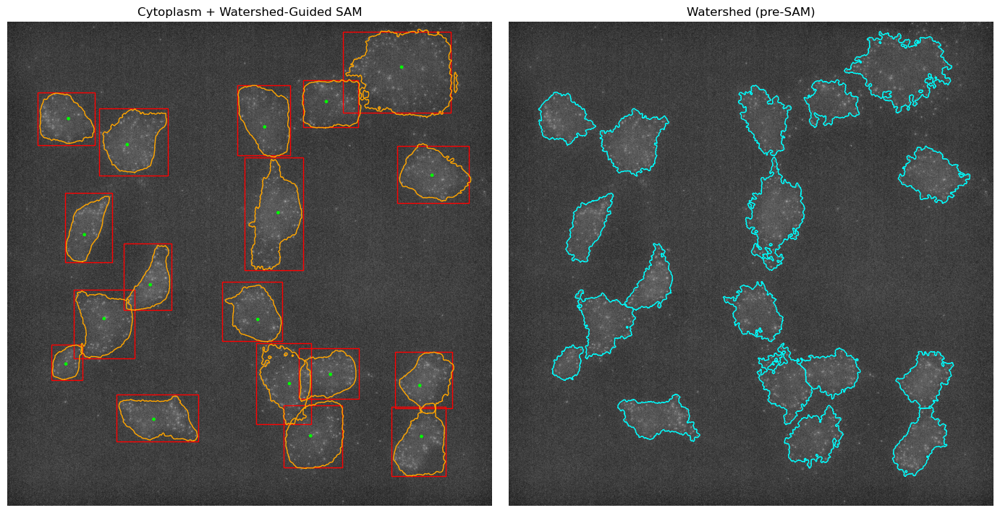

In [7]:
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi
import pathlib

# --------------------------------------
# Helper functions
# --------------------------------------

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def gradient(channel, ksize=5):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
    return cv2.morphologyEx(channel, cv2.MORPH_GRADIENT, kernel)

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_closing(m, footprint=morphology.disk(3))
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def mask_to_bbox(mask):
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None
    return (xs.min(), ys.min(), xs.max(), ys.max())

def watershed_segment_with_centers(cyt_img, centers):
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    binary = morphology.remove_small_objects(binary, min_size=1000)
    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    edges = filters.sobel(cyt_img)
    elevation = -dist + 5 * edges
    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels)+1):
        mask = (labels == i)
        if np.sum(mask) > 0:
            masks.append(postproc_mask(mask))
    return masks

# --------------------------------------
# Load image and preprocess
# --------------------------------------


with tifffile.TiffFile(image_path) as tif:
    ch = tif.pages[1].asarray() # testing with 488
    nucleus = tif.pages[2].asarray()

ch = normalize_to_uint8(ch)

# ----- ESTIMATE SIGMA - Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
sigma_est = estimate_sigma(ch, channel_axis=-1, average_sigmas=True)
print(f'Estimated Gaussian noise standard deviation = {sigma_est}')

cyt_clahe = clahe_filter(ch)


# cyt_clahe = clahe_filter(ch)
# cyt_grad = gradient(clahe)

# ----- ESTIMATE SIGMA - Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
sigma_est = estimate_sigma(cyt_clahe, channel_axis=-1, average_sigmas=True)
print(f'Estimated Gaussian noise standard deviation = {sigma_est}')

sigma_norm = sigma_est + 3.0
sigma_weak = sigma_est - 10.0

cyt_bilat = cv2.bilateralFilter(cyt_clahe, d=9, sigmaColor=sigma_norm, sigmaSpace=15, borderType=cv2.BORDER_REFLECT_101)
cyt_edge_preserved = cv2.edgePreservingFilter(cyt_clahe, flags=1, sigma_s=sigma_norm, sigma_r=0.4)

cyt_grad = gradient(cyt_bilat)
cyt_bilat_edge = cv2.edgePreservingFilter(cyt_bilat, flags=1, sigma_s=sigma_weak, sigma_r=0.4)

laplacian = cv2.Laplacian(ch, cv2.CV_64F)
laplacian = cv2.convertScaleAbs(laplacian)
cyt_blended = cv2.addWeighted(cyt_bilat, 0.8, laplacian, 0.2, 0)

# --------
# Stacking
# --------
cyt_rgb = np.stack([cyt_blended, cyt_edge_preserved, cyt_bilat_edge], axis=-1)
bbox_nucleus = f.AppIntDINOwrapper(nucleus) 
centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

# --- Creating Masks ---
masks_clahe = watershed_segment_with_centers(cyt_clahe, centers)
# masks_grad = watershed_segment(grad, centers)
masks_blended = watershed_segment_with_centers(cyt_blended, centers)
masks_bilat = watershed_segment(cyt_bilat, centers)
masks_edge_preserved = watershed_segment(cyt_edge_preserved, centers)
masks_bilat_edge = watershed_segment(cyt_bilat_edge, centers)

# --- Creating BBoxes ---
bbox_cyto = [mask_to_bbox(m) for m in masks_edge_preserved]
bbox_cyto = [b for b in bbox_cyto if b is not None]
bbox_cyto = [
    [float(x1), float(y1), float(x2), float(y2)] 
    for (x1, y1, x2, y2) in bbox_cyto
]


# -----------------------------
# SAM segmentation guided by boxes
# -----------------------------
masks_all = f.finetune.AppIntPREDICTCytoplasmWrapper(cyt_rgb, bbox_cyto)

masks = []
for mset in masks_all:
    areas = [(mm > 0).sum() for mm in mset]
    best = mset[np.argmax(areas)]
    masks.append(postproc_mask(best))

# --------------------------------------
# Visualization
# --------------------------------------
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

# Cytoplasm + masks
ax[0].imshow(cyt_clahe, cmap='gray')
ax[0].set_title("Cytoplasm + Watershed-Guided SAM")
ax[0].axis('off')
for (x1, y1, x2, y2), (cx, cy) in zip(bbox_cyto, centers):
    ax[0].add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none', lw=1))
    ax[0].add_patch(Circle((cx, cy), radius=5, color='lime', fill=True))
for mask in masks:
    for contour in measure.find_contours(mask, 0.5):
        ax[0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

# Watershed-only (pre-SAM)
ax[1].imshow(cyt_clahe, cmap='gray')
ax[1].set_title("Watershed (pre-SAM)")
ax[1].axis('off')
for wm in masks_edge_preserved:  # or use masks_clahe / masks_bilat / masks_blended / masks_bilat_edge
    for contour in measure.find_contours(wm, 0.5):
        ax[1].plot(contour[:, 1], contour[:, 0], linewidth=1, color='cyan')

plt.tight_layout()
plt.show()

### Calculating entropy

final text_encoder_type: bert-base-uncased


[2025-08-20 01:10:49,268][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 01:10:49,268][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 01:10:49,268][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 01:10:49,268][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 01:10:49,268][INFO] CHECK: Model version 3.50 loaded


[INFO] Device: cpu
[INFO] DINO model loaded: True
[INFO] SAM ready (model is not None): True
[INFO] supported versions: ['1.1', '1.100', '2.1', '3.1', '3.5', '3.20', '3.50']
[INFO] model path: assets\model\fish_v3.50.pth
[INFO] Reading C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\kayleigh_composite\488_pb5sp5_s5.composite.tif
[INFO] Found 18 nucleus centers
[DBG] ws_blended_0_in: shape=(2048, 2048), ndim=2, dtype=uint8, min=0, max=1
[DBG] ws_blended_0_in: uniques=[0 1]
[DBG] ws_blended_0_out: shape=(2048, 2048), ndim=2, dtype=uint8, min=0, max=1
[DBG] ws_blended_0_out: uniques=[0 1]
[DBG] ws_blended_1_in: shape=(2048, 2048), ndim=2, dtype=uint8, min=0, max=1
[DBG] ws_blended_1_in: uniques=[0 1]
[DBG] ws_blended_1_out: shape=(2048, 2048), ndim=2, dtype=uint8, min=0, max=1
[DBG] ws_blended_1_out: uniques=[0 1]
[DBG] ws_blended_2_in: shape=(2048, 2048), ndim=2, dtype=uint8, min=0, max=1
[DBG] ws_blended_2_in: uniques=[0 1]
[DBG] ws_blended_2_out: shape=(2048, 2048), ndim=2, dtype=uint8

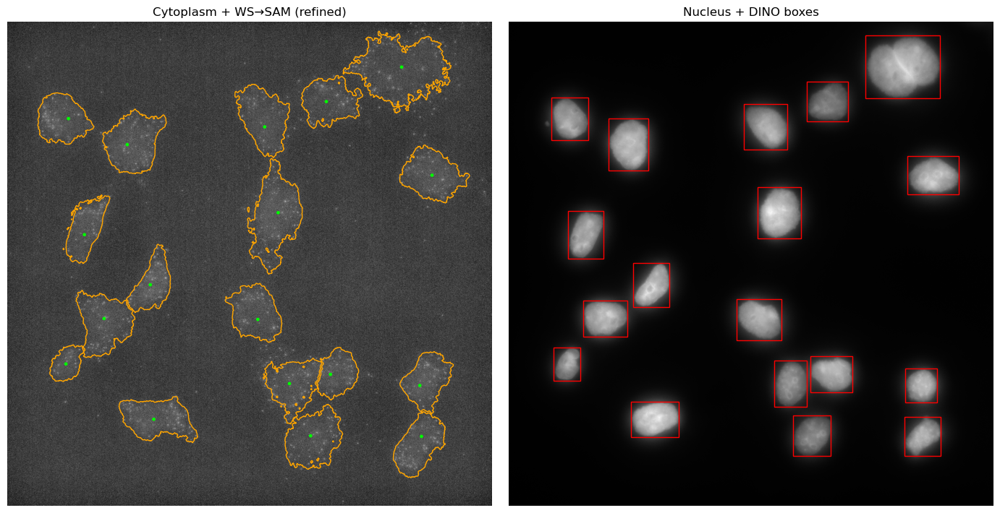

In [ ]:
# =========================
# Cytoplasm Segmentation Pipeline (DEBUG build)
# =========================

import os
import pathlib
import cv2
import numpy as np
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation
from skimage.measure import shannon_entropy
from skimage.restoration import estimate_sigma
from scipy import ndimage as ndi

# -------------------------
# Debug settings
# -------------------------
DEBUG = True
DEBUG_DUMP_DIR = "./debug_masks"   # set to None to disable saving

if DEBUG and DEBUG_DUMP_DIR is not None:
    os.makedirs(DEBUG_DUMP_DIR, exist_ok=True)

def debug_mask(name, arr, limit_uniques=10):
    """Print diagnostics about a mask/array."""
    if arr is None:
        print(f"[DBG] {name}: None")
        return
    a = np.asarray(arr)
    print(f"[DBG] {name}: shape={a.shape}, ndim={a.ndim}, dtype={a.dtype}, "
          f"min={a.min() if a.size>0 else 'NA'}, max={a.max() if a.size>0 else 'NA'}")
    # fast unique diagnostics
    try:
        u = np.unique(a)
        if len(u) > limit_uniques:
            print(f"[DBG] {name}: unique values count={len(u)}, first10={u[:10]}")
        else:
            print(f"[DBG] {name}: uniques={u}")
    except Exception as e:
        print(f"[DBG] {name}: uniques failed: {e}")

def dump_mask(name, arr):
    """Save mask to disk for inspection."""
    if not DEBUG or DEBUG_DUMP_DIR is None or arr is None:
        return
    a = np.asarray(arr)
    np.save(os.path.join(DEBUG_DUMP_DIR, f"{name}.npy"), a)

def assert_mask_2d_binary(name, arr):
    """Assert the mask is 2-D and binary-like."""
    if arr is None:
        raise AssertionError(f"[ASSERT] {name} is None")
    a = np.asarray(arr)
    if a.ndim != 2:
        raise AssertionError(f"[ASSERT] {name} must be 2-D; got shape {a.shape}")
    # binary-like: only 0/1 or 0/255 (we accept >0 == True)
    # don't force exact values; morphology uses boolean
    return True

def to_binary_2d(arr, name="mask"):
    """Coerce any mask to 2-D boolean array (H,W)."""
    if arr is None:
        raise ValueError(f"[to_binary_2d] {name} is None")
    a = np.asarray(arr)
    a = np.squeeze(a)

    if a.ndim == 3:
        # collapse channels by max; this is safe for masks
        a = a.max(axis=0)

    if a.ndim != 2:
        dump_mask(f"ERR_{name}_not2D", a)
        raise ValueError(f"[to_binary_2d] {name} expected 2-D after squeeze/collapse; got {a.shape}")

    return (a > 0)

# =========================
# Config / constants
# =========================
H, W = 2048, 2048
WATERSHED_SEED_RADIUS = 4
SAFE_HULL_DILATION = 3
AREA_OVER = 1.8
AREA_UNDER = 0.35
CLOSE_FOOT = 2
OPEN_FOOT  = 1

# =========================
# Utilities
# =========================
def normalize_to_uint8(img):
    img = img.astype(np.float32)
    img -= img.min()
    mx = img.max()
    if mx > 0:
        img = img / mx * 255.0
    return img.astype(np.uint8)

def gradient(channel, ksize=5):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
    return cv2.morphologyEx(channel, cv2.MORPH_GRADIENT, kernel)

def mask_to_bbox(mask):
    mask = to_binary_2d(mask, "mask_to_bbox_input")
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None
    return (int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max()))

def pad_box(b, pad=6):
    if b is None:
        return None
    x1, y1, x2, y2 = map(int, b)
    return [max(0, x1-pad), max(0, y1-pad), min(W, x2+pad), min(H, y2+pad)]

def area(mask):
    if mask is None:
        return 0
    m = to_binary_2d(mask, "area_input")
    return int(m.sum())

# =========================
# Adaptive preprocessing
# =========================
def auto_params(img8):
    p1, p99 = np.percentile(img8, [1, 99])
    spread = max(1.0, float(p99 - p1))
    ent = float(shannon_entropy(img8))
    edged = float((filters.sobel(img8) > 0.05).mean())
    sig_est = float(estimate_sigma(img8, channel_axis=None, average_sigmas=True))

    clip = np.interp(spread, [20, 80], [6.0, 3.0])
    clip += np.interp(ent, [3.5, 7.0], [0.5, -0.5])
    clip = float(np.clip(clip, 3.0, 6.0))

    sigma_color = float(np.clip(sig_est + 3.0, 3.0, 15.0))
    sigma_space = int(np.clip(np.interp(edged, [0.03, 0.12], [17, 9]), 9, 17))

    w_edge = float(np.clip(1.0 - 5.0*edged, 0.2, 0.8))
    return clip, sigma_color, sigma_space, w_edge

def clahe_filter(img8, clip_limit, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=float(clip_limit), tileGridSize=tile_size)
    return c.apply(img8)

def adaptive_preprocess(ch_uint8):
    clip, s_color, s_space, w_edge = auto_params(ch_uint8)

    cyt_clahe = clahe_filter(ch_uint8, clip_limit=clip)
    cyt_bilat = cv2.bilateralFilter(
        cyt_clahe, d=9, sigmaColor=s_color, sigmaSpace=s_space,
        borderType=cv2.BORDER_REFLECT_101
    )
    cyt_edge_pres = cv2.edgePreservingFilter(
        cyt_clahe, flags=1, sigma_s=max(10, s_space), sigma_r=0.4
    )
    s_space_weak = max(5, s_space - 6)
    cyt_bilat_edge = cv2.edgePreservingFilter(
        cyt_bilat, flags=1, sigma_s=s_space_weak, sigma_r=0.4
    )

    lap = cv2.Laplacian(ch_uint8, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    cyt_blended = cv2.addWeighted(cyt_bilat, w_edge, lap, 1.0 - w_edge, 0)

    cyt_rgb = np.stack([cyt_blended, cyt_edge_pres, cyt_bilat_edge], axis=-1)
    return {
        "clahe": cyt_clahe,
        "bilat": cyt_bilat,
        "edge_pres": cyt_edge_pres,
        "bilat_edge": cyt_bilat_edge,
        "blended": cyt_blended,
        "rgb": cyt_rgb
    }

# =========================
# Watershed (multi-cue, disk markers)
# =========================
def watershed_labels(cyt_img_uint8, centers):
    thresh = filters.threshold_otsu(cyt_img_uint8)
    binary = cyt_img_uint8 > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    binary = morphology.remove_small_objects(binary, min_size=1000)

    dist  = ndi.distance_transform_edt(binary)
    edges = filters.sobel(cyt_img_uint8.astype(np.float32))
    tex   = filters.laplace(filters.gaussian(cyt_img_uint8.astype(np.float32), 1.0))

    markers = np.zeros_like(cyt_img_uint8, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < H and 0 <= xi < W:
            cv2.circle(markers, (xi, yi), WATERSHED_SEED_RADIUS, int(i), -1)

    elev = -0.7*dist + 4.0*edges + 1.5*np.abs(tex)
    labels = segmentation.watershed(elev, markers=markers, mask=binary)
    return labels

def labels_to_ordered_masks(labels, n_centers):
    return [(labels == i).astype(np.uint8) for i in range(1, n_centers+1)]

# =========================
# Postproc & refinement (with guards)
# =========================
def postproc_mask(m, tag="postproc"):
    debug_mask(f"{tag}_in", m)
    m = to_binary_2d(m, f"{tag}_to2d")
    try:
        m = morphology.remove_small_objects(m, min_size=200)
        m = morphology.binary_closing(m, footprint=morphology.disk(CLOSE_FOOT))
        m = morphology.binary_opening(m, footprint=morphology.disk(OPEN_FOOT))
    except Exception as e:
        dump_mask(f"ERR_{tag}_input", m)
        raise
    m = m.astype(np.uint8)
    debug_mask(f"{tag}_out", m)
    return m

def expected_area_from_ws(ws_masks):
    vals = []
    for i, m in enumerate(ws_masks):
        if m is None:
            continue
        try:
            vals.append(area(m))
        except Exception as e:
            print(f"[WARN] expected_area_from_ws: mask {i} invalid: {e}")
            dump_mask(f"ERR_expected_area_mask_{i}", m)
    return np.median(vals) if vals else None

def refine_instance(mask, expected_area, tag="refine"):
    debug_mask(f"{tag}_in", mask)
    m = to_binary_2d(mask, f"{tag}_to2d")
    a = int(m.sum())
    try:
        if expected_area is not None:
            if a > AREA_OVER * expected_area:
                m = morphology.binary_erosion(m, footprint=morphology.disk(1))
            elif a < AREA_UNDER * expected_area:
                m = morphology.binary_dilation(m, footprint=morphology.disk(1))
        m = morphology.binary_closing(m, footprint=morphology.disk(2))
        m = morphology.binary_opening(m, footprint=morphology.disk(1))
    except Exception as e:
        dump_mask(f"ERR_{tag}_input", m)
        raise
    m = m.astype(np.uint8)
    debug_mask(f"{tag}_out", m)
    return m

def safe_hull(mask, dil=SAFE_HULL_DILATION, tag="safe_hull"):
    debug_mask(f"{tag}_in", mask)
    if mask is None:
        return None
    m = to_binary_2d(mask, f"{tag}_to2d")
    try:
        m = morphology.binary_dilation(m, footprint=morphology.disk(dil)).astype(np.uint8)
    except Exception as e:
        dump_mask(f"ERR_{tag}_input", m)
        raise
    debug_mask(f"{tag}_out", m)
    return m

def clip_to_mask(sam_mask, hull, tag="clip"):
    debug_mask(f"{tag}_sam_in", sam_mask)
    debug_mask(f"{tag}_hull_in", hull)
    if sam_mask is None or hull is None:
        return sam_mask
    m1 = to_binary_2d(sam_mask, f"{tag}_sam_to2d")
    m2 = to_binary_2d(hull, f"{tag}_hull_to2d")
    out = (m1 & m2).astype(np.uint8)
    debug_mask(f"{tag}_out", out)
    return out

def majority_vote(masks_list):
    masks_list = [m for m in masks_list if m is not None]
    if not masks_list:
        return None
    stack = np.stack([to_binary_2d(m, "vote_item") for m in masks_list], axis=0).astype(np.uint8)
    votes = (stack.sum(axis=0) >= 2).astype(np.uint8)
    return votes

# =========================
# Main per-image pipeline (requires Fish instance)
# =========================
def process_image(image_path, fish):
    print(f"[INFO] Reading {image_path}")
    # 1) Load channels robustly
    with tifffile.TiffFile(image_path) as tif:
        n_pages = len(tif.pages)
        if n_pages < 3:
            raise ValueError(f"Expected ≥3 channels (cyt, nucleus), got {n_pages}")
        cyt     = tif.pages[min(1, n_pages-1)].asarray()
        nucleus = tif.pages[min(2, n_pages-1)].asarray()

    cyt8 = normalize_to_uint8(cyt)

    # 2) Adaptive preprocess
    P = adaptive_preprocess(cyt8)

    # 3) Nucleus boxes & centers via Fish instance
    bbox_nucleus = fish.AppIntDINOwrapper(nucleus)  # list of [x1,y1,x2,y2]
    centers = [((x1 + x2) / 2.0, (y1 + y2) / 2.0) for (x1, y1, x2, y2) in bbox_nucleus]
    nC = len(centers)
    print(f"[INFO] Found {nC} nucleus centers")

    # 4) Watershed on variants
    labels_blended = watershed_labels(P["blended"], centers)
    labels_edge    = watershed_labels(P["edge_pres"], centers)
    labels_biedge  = watershed_labels(P["bilat_edge"], centers)

    ws_blended = [postproc_mask(m, f"ws_blended_{i}") for i, m in enumerate(labels_to_ordered_masks(labels_blended, nC))]
    ws_edge    = [postproc_mask(m, f"ws_edge_{i}")    for i, m in enumerate(labels_to_ordered_masks(labels_edge,    nC))]
    ws_biedge  = [postproc_mask(m, f"ws_biedge_{i}")  for i, m in enumerate(labels_to_ordered_masks(labels_biedge,  nC))]

    # consensus watershed per instance
    ws_consensus = []
    for i in range(nC):
        mv = majority_vote([ws_blended[i], ws_edge[i], ws_biedge[i]])
        chosen = mv if (mv is not None and mv.any()) else max([ws_blended[i], ws_edge[i], ws_biedge[i]], key=lambda m: area(m))
        debug_mask(f"ws_consensus_{i}", chosen)
        ws_consensus.append(chosen)

    # 5) Expected area
    exp_area = expected_area_from_ws(ws_consensus)
    print(f"[INFO] Expected area (median WS): {exp_area}")

    # 6) BBoxes for SAM from ws_consensus
    bbox_cyto = [pad_box(mask_to_bbox(m), pad=6) for m in ws_consensus]
    valid_idx = [i for i, b in enumerate(bbox_cyto) if b is not None]
    bbox_cyto_valid = [bbox_cyto[i] for i in valid_idx]
    print(f"[INFO] Valid cyto boxes: {len(bbox_cyto_valid)}/{len(bbox_cyto)}")

    # 7) SAM prediction guided by boxes
    sam_best = [None] * nC
    if bbox_cyto_valid:
        sam_masks = fish.finetune.AppIntPREDICTCytoplasmWrapper(P["rgb"], bbox_cyto_valid)
        debug_mask("sam_masks_raw", sam_masks)
        # Ensure list/array is iterable
        if isinstance(sam_masks, np.ndarray) and sam_masks.ndim == 3:
            # shape (K, H, W)
            pass
        # Map back to per-center
        k = 0
        for i in range(nC):
            if bbox_cyto[i] is None:
                continue
            m = sam_masks[k]
            debug_mask(f"sam_raw_{i}", m)
            # Squeeze & binarize NOW to avoid 3-D issues downstream
            m = to_binary_2d(m, f"sam_{i}_to2d")
            sam_best[i] = m.astype(np.uint8)
            debug_mask(f"sam_best_{i}", sam_best[i])
            k += 1

    # 8) Safe-hull clipping + refine + guardrails
    final_masks = []
    for i in range(nC):
        ws = ws_consensus[i]
        sm = sam_best[i]
        debug_mask(f"loop_ws_{i}", ws)
        debug_mask(f"loop_sm_{i}", sm)
        if sm is None or not to_binary_2d(sm, f"sm_{i}").any():
            final_masks.append(to_binary_2d(ws, f"ws_{i}").astype(np.uint8))
            continue
        hull    = safe_hull(ws, tag=f"safe_hull_{i}")
        clipped = clip_to_mask(sm, hull, tag=f"clip_{i}")
        try:
            refined = refine_instance(clipped, exp_area, tag=f"refine_{i}")
        except Exception as e:
            print(f"[ERR] refine_instance failed on cell {i}: {e}")
            dump_mask(f"ERR_refine_input_{i}", clipped)
            raise
        if exp_area is not None:
            a = int(refined.sum())
            if a > AREA_OVER * exp_area or a < AREA_UNDER * exp_area:
                print(f"[WARN] cell {i} area {a} out of bounds; fallback to WS")
                refined = to_binary_2d(ws, f"ws_fb_{i}").astype(np.uint8)
        final_masks.append(refined.astype(np.uint8))
        debug_mask(f"final_{i}", final_masks[-1])

    return {
        "cyt8": normalize_to_uint8(cyt),
        "nucleus": nucleus,
        "centers": centers,
        "bbox_nucleus": bbox_nucleus,
        "bbox_cyto": [b for b in bbox_cyto if b is not None],
        "ws_masks": ws_consensus,
        "sam_masks": sam_best,
        "final_masks": final_masks
    }

# =========================
# Visualization
# =========================
def show_result(res, title="Cytoplasm + WS→SAM (refined)"):
    cyt = res["cyt8"]
    centers = res["centers"]

    bg = clahe_filter(cyt, clip_limit=4.0)

    fig, ax = plt.subplots(1, 2, figsize=(14, 7))
    ax[0].imshow(bg, cmap='gray')
    ax[0].set_title(title)
    ax[0].axis('off')

    for (cx, cy) in centers:
        ax[0].add_patch(Circle((cx, cy), radius=5, color='lime', fill=True))

    for i, mask in enumerate(res["final_masks"]):
        if mask is None:
            continue
        m = to_binary_2d(mask, f"viz_final_{i}")
        for contour in measure.find_contours(m, 0.5):
            ax[0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')

    ax[1].imshow(res["nucleus"], cmap='gray')
    ax[1].set_title("Nucleus + DINO boxes")
    ax[1].axis('off')
    for (x1, y1, x2, y2) in res["bbox_nucleus"]:
        ax[1].add_patch(Rectangle((x1, y1), x2-x1, y2-y1, edgecolor='red', facecolor='none', lw=1))

    plt.tight_layout()
    plt.show()

# =========================
# Run
# =========================
if __name__ == "__main__":
    # 1) Your Fish class must match SAM model+processor (both base or both huge).
    # 2) supported_version in config must include MODEL_VER
    from fishCore import Fish

    CFG_PATH   = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\config.ini"
    IMAGE_PATH = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\kayleigh_composite\488_pb5sp5_s5.composite.tif"
    MODEL_VER  = "3.50"

    fish = Fish(config=pathlib.Path(CFG_PATH))
    fish.set_model_version(MODEL_VER)

    print(f"[INFO] Device: {fish.device}")
    print(f"[INFO] DINO model loaded: {hasattr(fish, 'gdino_model')}")
    print(f"[INFO] SAM ready (model is not None): {fish.model is not None}")
    print(f"[INFO] supported versions: {fish.supported_version}")
    print(f"[INFO] model path: {fish.asset_folder_path / 'model' / f'fish_v{MODEL_VER}.pth'}")

    res = process_image(IMAGE_PATH, fish=fish)
    show_result(res)


final text_encoder_type: bert-base-uncased


[2025-08-20 02:02:34,076][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:02:34,076][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:02:34,076][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:02:34,076][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:02:34,076][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:02:34,076][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:02:34,076][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:02:34,076][INFO] CHECK: Model version 3.50 loaded


[INFO] Device: cpu
[INFO] DINO model loaded: True
[INFO] SAM ready: True
[CYTO] Starting prediction for 18 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [1411, 32, 1882, 393]
[CYTO] Processing box [899, 1080, 1170, 1361]
[CYTO] Processing box [1639, 517, 1958, 774]
[CYTO] Processing box [483, 929, 705, 1238]
[CYTO] Processing box [1237, 221, 1506, 455]
[CYTO] Processing box [231, 717, 451, 1035]
[CYTO] Processing box [116, 289, 376, 530]
[CYTO] Processing box [458, 1564, 817, 1784]
[CYTO] Processing box [1608, 1617, 1861, 1938]
[CYTO] Processing box [274, 1121, 544, 1438]
[CYTO] Processing box [1224, 1370, 1496, 1604]
[CYTO] Processing box [380, 359, 684, 663]
[CYTO] Processing box [951, 258, 1203, 581]
[CYTO] Processing box [1152, 1614, 1421, 1898]
[CYTO] Processing box [166, 1357, 329, 1528]
[CYTO] Processing box [1629, 1382, 1889, 1636]
[CYTO] Processing box [1039, 1352, 1294, 1714]
[CYTO] Proces

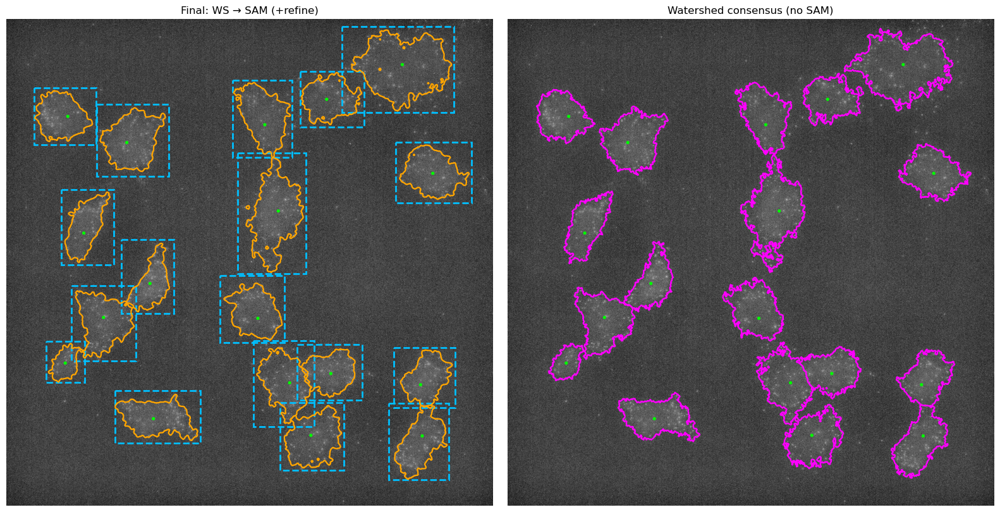

In [ ]:
# =========================================
# Cytoplasm Segmentation: WS → SAM (+ local MGAC)
# Plot: LEFT = Final + cyto boxes, RIGHT = WS-only
# =========================================

import inspect
import pathlib
import numpy as np
import cv2
import tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation, exposure
from skimage.measure import shannon_entropy
from skimage.restoration import estimate_sigma
from scipy import ndimage as ndi

# ---------- Optional MGAC (auto-disable if missing) ----------
USE_MGAC = True
try:
    from skimage.segmentation import (
        morphological_geodesic_active_contour as MGAC,
        inverse_gaussian_gradient,
    )
except Exception:
    USE_MGAC = False

# ---------- Tunables ----------
SEED_RADIUS = 4
SAFE_HULL_DILATION = 4
AREA_OVER = 2.2
AREA_UNDER = 0.30
CLOSE_FOOT = 2
OPEN_FOOT  = 1
PAD_BOX = 8
MIN_OBJ = 200
WS_MIN_HOLE = 1000
WS_MIN_OBJ  = 1000

# Watershed cue weights
W_DIST  = 1.2
W_EDGE  = 2.5
W_TEX   = 0.4
H_MINIMA = 0.0  # raise if you see tiny spurious basins

# Local MGAC params (per-cell ROI)
MGAC_ITERS   = 25
MGAC_SMOOTH  = 2
MGAC_BALLOON = -0.3    # slight shrink to avoid leaking
MGAC_SIGMA   = 1.2
MGAC_PAD     = 6       # extra padding around bbox for the ROI


# ---------- Helpers ----------
def to_binary_2d(arr, name="mask"):
    if arr is None:
        raise ValueError(f"{name} is None")
    a = np.asarray(arr).squeeze()
    if a.ndim == 3:
        a = a.max(axis=0)
    if a.ndim != 2:
        raise ValueError(f"{name} must be 2-D after squeeze; got {a.shape}")
    return (a > 0)

def normalize_to_uint8(img):
    img = img.astype(np.float32)
    img -= img.min()
    mx = img.max()
    if mx > 0:
        img = img / mx * 255.0
    return img.astype(np.uint8)

def mask_to_bbox(mask):
    m = to_binary_2d(mask, "mask_to_bbox_input")
    ys, xs = np.where(m)
    if xs.size == 0 or ys.size == 0:
        return None
    return (int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max()))

def pad_box_xyxy(b, pad=PAD_BOX, shape=None):
    if b is None: return None
    x1,y1,x2,y2 = map(int, b)
    H = shape[0] if shape is not None else None
    W = shape[1] if shape is not None else None
    if H is None or W is None:
        # fallback to 2048x2048 if shape not provided
        H, W = 2048, 2048
    return [max(0,x1-pad), max(0,y1-pad), min(W,x2+pad), min(H,y2+pad)]

def expected_area_from_ws(ws_masks):
    vals = []
    for m in ws_masks:
        if m is None: continue
        vals.append(int(to_binary_2d(m).sum()))
    return np.median(vals) if vals else None


# ---------- Adaptive preprocessing ----------
def auto_params(img8):
    p1, p99 = np.percentile(img8, [1,99])
    spread = max(1.0, float(p99 - p1))
    ent = float(shannon_entropy(img8))
    edged = float((filters.sobel(img8) > 0.05).mean())
    sig_est = float(estimate_sigma(img8, channel_axis=None, average_sigmas=True))

    clip = np.interp(spread, [20,80], [6.0,3.0])
    clip += np.interp(ent, [3.5,7.0], [0.5,-0.5])
    clip = float(np.clip(clip, 3.0, 6.0))

    sigma_color = float(np.clip(sig_est + 3.0, 3.0, 15.0))
    sigma_space = int(np.clip(np.interp(edged, [0.03,0.12], [17,9]), 9,17))

    w_edge = float(np.clip(1.0 - 5.0*edged, 0.25, 0.8))
    return clip, sigma_color, sigma_space, w_edge

def clahe_filter(img8, clip_limit, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=float(clip_limit), tileGridSize=tile_size)
    return c.apply(img8)

def adaptive_preprocess(ch_uint8):
    clip, s_color, s_space, w_edge = auto_params(ch_uint8)
    cyt_clahe = clahe_filter(ch_uint8, clip_limit=clip)
    cyt_bilat = cv2.bilateralFilter(cyt_clahe, d=9, sigmaColor=s_color, sigmaSpace=s_space,
                                    borderType=cv2.BORDER_REFLECT_101)
    cyt_edge_pres = cv2.edgePreservingFilter(cyt_clahe, flags=1, sigma_s=max(10, s_space), sigma_r=0.4)
    s_space_weak = max(5, s_space-6)
    cyt_bilat_edge = cv2.edgePreservingFilter(cyt_bilat, flags=1, sigma_s=s_space_weak, sigma_r=0.4)
    lap = cv2.Laplacian(ch_uint8, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    cyt_blended = cv2.addWeighted(cyt_bilat, w_edge, lap, 1.0 - w_edge, 0)
    cyt_rgb = np.stack([cyt_blended, cyt_edge_pres, cyt_bilat_edge], axis=-1)
    return {
        "clahe": cyt_clahe,
        "bilat": cyt_bilat,
        "edge_pres": cyt_edge_pres,
        "bilat_edge": cyt_bilat_edge,
        "blended": cyt_blended,
        "rgb": cyt_rgb
    }


# ---------- Watershed ----------
def watershed_labels(cyt_img_uint8, centers):
    thr = filters.threshold_otsu(cyt_img_uint8)
    binary = cyt_img_uint8 > thr
    binary = morphology.remove_small_holes(binary, area_threshold=WS_MIN_HOLE)
    binary = morphology.remove_small_objects(binary, min_size=WS_MIN_OBJ)

    dist = ndi.distance_transform_edt(binary)
    g = cv2.GaussianBlur(cyt_img_uint8, (0,0), 1.2)
    edge = filters.scharr(g)
    if H_MINIMA > 0:
        edge = morphology.h_minima(edge, H_MINIMA)
    tex = filters.laplace(filters.gaussian(cyt_img_uint8.astype(np.float32), 1.0))

    markers = np.zeros_like(cyt_img_uint8, dtype=np.int32)
    for i,(cx,cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img_uint8.shape[0] and 0 <= xi < cyt_img_uint8.shape[1]:
            cv2.circle(markers, (xi, yi), SEED_RADIUS, int(i), -1)

    elev = -W_DIST*dist + W_EDGE*edge + W_TEX*np.abs(tex)
    labels = segmentation.watershed(elev, markers=markers, mask=binary)
    return labels

def labels_to_masks(labels, n):
    return [(labels == i).astype(np.uint8) for i in range(1, n+1)]


# ---------- Post-processing ----------
def postproc_mask(m):
    m = to_binary_2d(m)
    m = morphology.remove_small_objects(m, min_size=MIN_OBJ)
    m = morphology.binary_closing(m, footprint=morphology.disk(CLOSE_FOOT))
    m = morphology.binary_opening(m, footprint=morphology.disk(OPEN_FOOT))
    return m.astype(np.uint8)

def safe_hull(mask, dil=SAFE_HULL_DILATION):
    m = to_binary_2d(mask)
    return morphology.binary_dilation(m, footprint=morphology.disk(dil)).astype(np.uint8)

def clip_to_mask(sam_mask, hull):
    m1 = to_binary_2d(sam_mask)
    m2 = to_binary_2d(hull)
    return (m1 & m2).astype(np.uint8)

def area_refine(mask, expected_area):
    m = to_binary_2d(mask)
    a = int(m.sum())
    if expected_area is not None:
        if a > AREA_OVER*expected_area:
            m = morphology.binary_erosion(m, footprint=morphology.disk(1))
        elif a < AREA_UNDER*expected_area:
            m = morphology.binary_dilation(m, footprint=morphology.disk(1))
    m = morphology.binary_closing(m, footprint=morphology.disk(2))
    m = morphology.binary_opening(m, footprint=morphology.disk(1))
    return m.astype(np.uint8)


# ---------- Local MGAC (per-cell ROI only) ----------
def mgac_snap_local(full_img_uint8, mask_full, bbox_xyxy):
    """Run MGAC only inside bbox+pad ROI, initialized by the refined mask."""
    if not USE_MGAC:
        return to_binary_2d(mask_full).astype(np.uint8)

    M = to_binary_2d(mask_full).astype(np.uint8)
    H, W = M.shape
    x1,y1,x2,y2 = map(int, bbox_xyxy)

    x1p = max(0, x1 - MGAC_PAD); y1p = max(0, y1 - MGAC_PAD)
    x2p = min(W, x2 + MGAC_PAD); y2p = min(H, y2 + MGAC_PAD)

    roi_img = full_img_uint8[y1p:y2p, x1p:x2p]
    roi_msk = M[y1p:y2p, x1p:x2p].astype(np.float32)

    roi = roi_img.astype(np.float32)
    if roi.max() > 0:
        roi /= roi.max()
    gimg = inverse_gaussian_gradient(cv2.GaussianBlur(roi, (0,0), MGAC_SIGMA))

    sig = inspect.signature(MGAC).parameters
    kwargs = dict(init_level_set=roi_msk, smoothing=MGAC_SMOOTH, balloon=MGAC_BALLOON)
    if "num_iter" in sig: kwargs["num_iter"] = MGAC_ITERS
    else:                 kwargs["iterations"] = MGAC_ITERS

    ls = MGAC(gimg, **kwargs)
    roi_refined = (ls > 0).astype(np.uint8)

    out = np.zeros_like(M, dtype=np.uint8)
    out[y1p:y2p, x1p:x2p] = roi_refined
    return out


# ---------- Main pipeline ----------
def process_image(image_path, fish):
    with tifffile.TiffFile(image_path) as tif:
        n_pages = len(tif.pages)
        if n_pages < 3:
            raise ValueError(f"Expected ≥3 pages (got {n_pages})")
        cyt     = tif.pages[min(1, n_pages-1)].asarray()
        nucleus = tif.pages[min(2, n_pages-1)].asarray()

    cyt8 = normalize_to_uint8(cyt)
    H, W = cyt8.shape
    P = adaptive_preprocess(cyt8)

    # DINO nucleus boxes & centers (used only to seed watershed)
    bbox_nucleus = fish.AppIntDINOwrapper(nucleus)  # [[x1,y1,x2,y2], ...]
    centers = [((x1+x2)/2.0, (y1+y2)/2.0) for (x1,y1,x2,y2) in bbox_nucleus]
    nC = len(centers)

    # Watershed on 3 variants
    labels_b  = watershed_labels(P["blended"],    centers)
    labels_e  = watershed_labels(P["edge_pres"],  centers)
    labels_be = watershed_labels(P["bilat_edge"], centers)
    ws_b  = [postproc_mask(m) for m in labels_to_masks(labels_b,  nC)]
    ws_e  = [postproc_mask(m) for m in labels_to_masks(labels_e,  nC)]
    ws_be = [postproc_mask(m) for m in labels_to_masks(labels_be, nC)]

    # consensus per instance
    ws_cons = []
    for i in range(nC):
        stack = np.stack([to_binary_2d(ws_b[i]), to_binary_2d(ws_e[i]), to_binary_2d(ws_be[i])], axis=0)
        mv = (stack.sum(axis=0) >= 2).astype(np.uint8)
        ws_cons.append(mv if mv.any() else max([ws_b[i], ws_e[i], ws_be[i]], key=lambda m: int(to_binary_2d(m).sum())))

    exp_area = expected_area_from_ws(ws_cons)

    # cyto bboxes for SAM (fallback to nucleus box)
    bbox_cyto = []
    for i, m in enumerate(ws_cons):
        b = mask_to_bbox(m)
        if b is None:
            b = bbox_nucleus[i] if i < len(bbox_nucleus) else None
        bbox_cyto.append(pad_box_xyxy(b, PAD_BOX, shape=cyt8.shape) if b is not None else None)

    valid_idx = [i for i,b in enumerate(bbox_cyto) if b is not None]
    bbox_cyto_valid = [bbox_cyto[i] for i in valid_idx]

    # SAM per valid cyto box (image is 3-channel stack)
    sam_best = [None] * nC
    if bbox_cyto_valid:
        sam_masks = fish.finetune.AppIntPREDICTCytoplasmWrapper(P["rgb"], bbox_cyto_valid)
        k = 0
        for i in range(nC):
            if bbox_cyto[i] is None: 
                continue
            m = to_binary_2d(sam_masks[k]).astype(np.uint8)
            sam_best[i] = m
            k += 1

    # refine each instance
    final_masks = []
    for i in range(nC):
        ws = ws_cons[i]
        sm = sam_best[i]
        if sm is None or not sm.any():
            final_masks.append(ws)
            continue

        hull    = safe_hull(ws, SAFE_HULL_DILATION)
        clipped = clip_to_mask(sm, hull)
        refined = area_refine(clipped, exp_area)

        # LOCAL MGAC only inside that cell's bbox (if present)
        if USE_MGAC and bbox_cyto[i] is not None:
            refined = mgac_snap_local(P["blended"], refined, bbox_cyto[i])
            # guardrails after MGAC
            if exp_area is not None:
                a = int(refined.sum())
                if a > AREA_OVER*exp_area or a < AREA_UNDER*exp_area:
                    refined = ws

        final_masks.append(refined.astype(np.uint8))

    return {
        "cyt8": cyt8,
        "centers": centers,
        "bbox_cyto": [b for b in bbox_cyto if b is not None],
        "ws_masks": ws_cons,
        "final_masks": final_masks
    }


# ---------- Plot: LEFT final + boxes, RIGHT WS-only ----------
def show_ws_vs_final(res,
                     title_left="Final: WS → SAM (+refine)",
                     title_right="Watershed consensus (no SAM)"):
    cyt = res["cyt8"]
    ws_masks = res["ws_masks"]
    final_masks = res["final_masks"]
    bbox_cyto = res.get("bbox_cyto", [])
    centers = res.get("centers", [])

    # gentle contrast so outlines are visible
    bg = exposure.equalize_adapthist(cyt, clip_limit=0.02)
    bg = (bg * 255).astype(np.uint8)

    fig, ax = plt.subplots(1, 2, figsize=(16, 8))

    # -------- Left: final WS→SAM (+refine) --------
    ax[0].imshow(bg, cmap="gray")
    ax[0].set_title(title_left)
    ax[0].axis("off")

    # cyto bboxes (blue dashed)
    for b in bbox_cyto:
        if b is None: 
            continue
        x1, y1, x2, y2 = map(int, b)
        ax[0].add_patch(
            Rectangle((x1, y1), x2 - x1, y2 - y1,
                      edgecolor="deepskyblue", facecolor="none",
                      linewidth=2.0, linestyle="--", zorder=3)
        )

    # final contours (orange)
    for m in final_masks:
        if m is None:
            continue
        m = (np.asarray(m) > 0)
        for c in measure.find_contours(m, 0.5):
            ax[0].plot(c[:, 1], c[:, 0], color="orange", linewidth=1.6, zorder=4)

    # centers (green)
    for (cx, cy) in centers:
        ax[0].add_patch(Circle((cx, cy), radius=5, color="lime", fill=True, zorder=5))

    # -------- Right: watershed consensus only --------
    ax[1].imshow(bg, cmap="gray")
    ax[1].set_title(title_right)
    ax[1].axis("off")

    # watershed contours (magenta)
    for m in ws_masks:
        if m is None:
            continue
        m = (np.asarray(m) > 0)
        for c in measure.find_contours(m, 0.5):
            ax[1].plot(c[:, 1], c[:, 0], color="magenta", linewidth=1.6, zorder=4)

    # centers for reference
    for (cx, cy) in centers:
        ax[1].add_patch(Circle((cx, cy), radius=5, color="lime", fill=True, zorder=5))

    plt.tight_layout()
    plt.show()


# ---------- Run ----------
if __name__ == "__main__":
    from fishCore import Fish  # your class

    CFG_PATH   = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\config.ini"
    IMAGE_PATH = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\kayleigh_composite\488_pb5sp5_s5.composite.tif"
    MODEL_VER  = "3.50"  # must be listed in config [general].supported_version

    fish = Fish(config=pathlib.Path(CFG_PATH))
    fish.set_model_version(MODEL_VER)

    print(f"[INFO] Device: {fish.device}")
    print(f"[INFO] DINO model loaded: {hasattr(fish, 'gdino_model')}")
    print(f"[INFO] SAM ready: {fish.model is not None}")

    res = process_image(IMAGE_PATH, fish=fish)
    show_ws_vs_final(res)


final text_encoder_type: bert-base-uncased


[2025-08-20 02:20:08,155][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:20:08,155][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:20:08,155][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:20:08,155][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:20:08,155][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:20:08,155][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:20:08,155][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:20:08,155][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 02:20:08,155][INFO] CHECK: Model version 3.50 loaded


[CYTO] Starting prediction for 18 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [1411, 32, 1882, 393]
[CYTO] Processing box [899, 1080, 1170, 1361]
[CYTO] Processing box [1639, 517, 1958, 774]
[CYTO] Processing box [483, 929, 705, 1238]
[CYTO] Processing box [1237, 221, 1506, 455]
[CYTO] Processing box [231, 717, 451, 1035]
[CYTO] Processing box [116, 289, 376, 530]
[CYTO] Processing box [458, 1564, 817, 1784]
[CYTO] Processing box [1608, 1617, 1861, 1938]
[CYTO] Processing box [274, 1121, 544, 1438]
[CYTO] Processing box [1224, 1370, 1496, 1604]
[CYTO] Processing box [380, 359, 684, 663]
[CYTO] Processing box [951, 258, 1203, 581]
[CYTO] Processing box [1152, 1614, 1421, 1898]
[CYTO] Processing box [166, 1357, 329, 1528]
[CYTO] Processing box [1629, 1382, 1889, 1636]
[CYTO] Processing box [1039, 1352, 1294, 1714]
[CYTO] Processing box [974, 564, 1260, 1072]

[Auto-params]
            p1: 15.0000
  

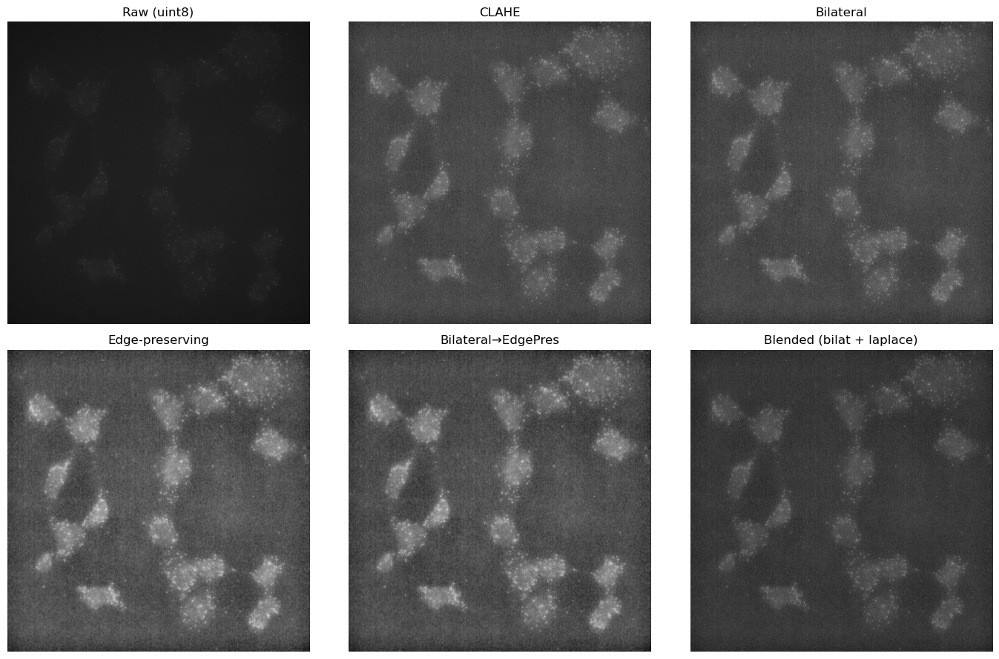

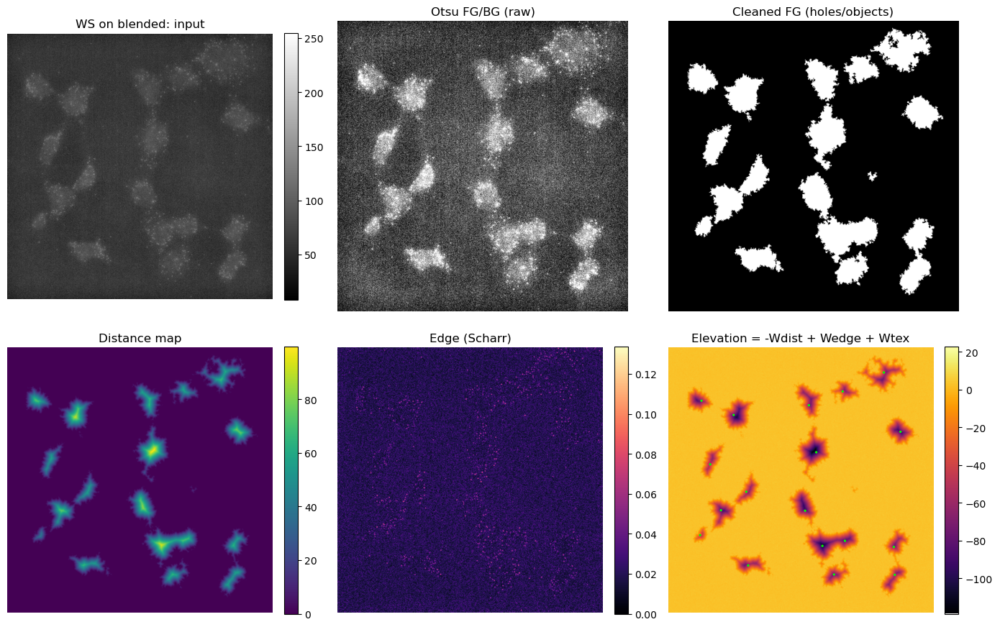

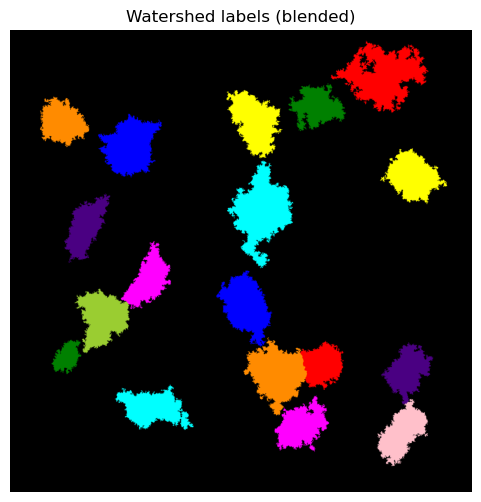

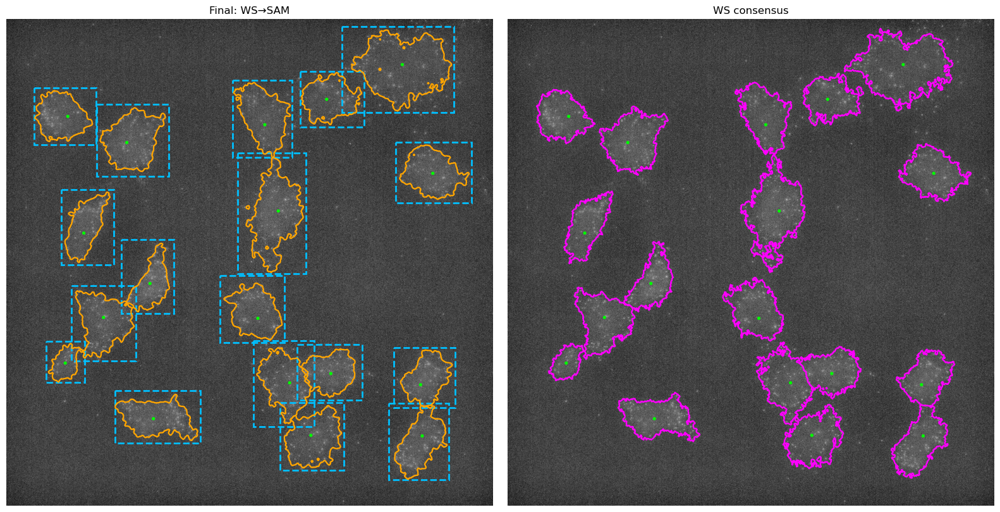

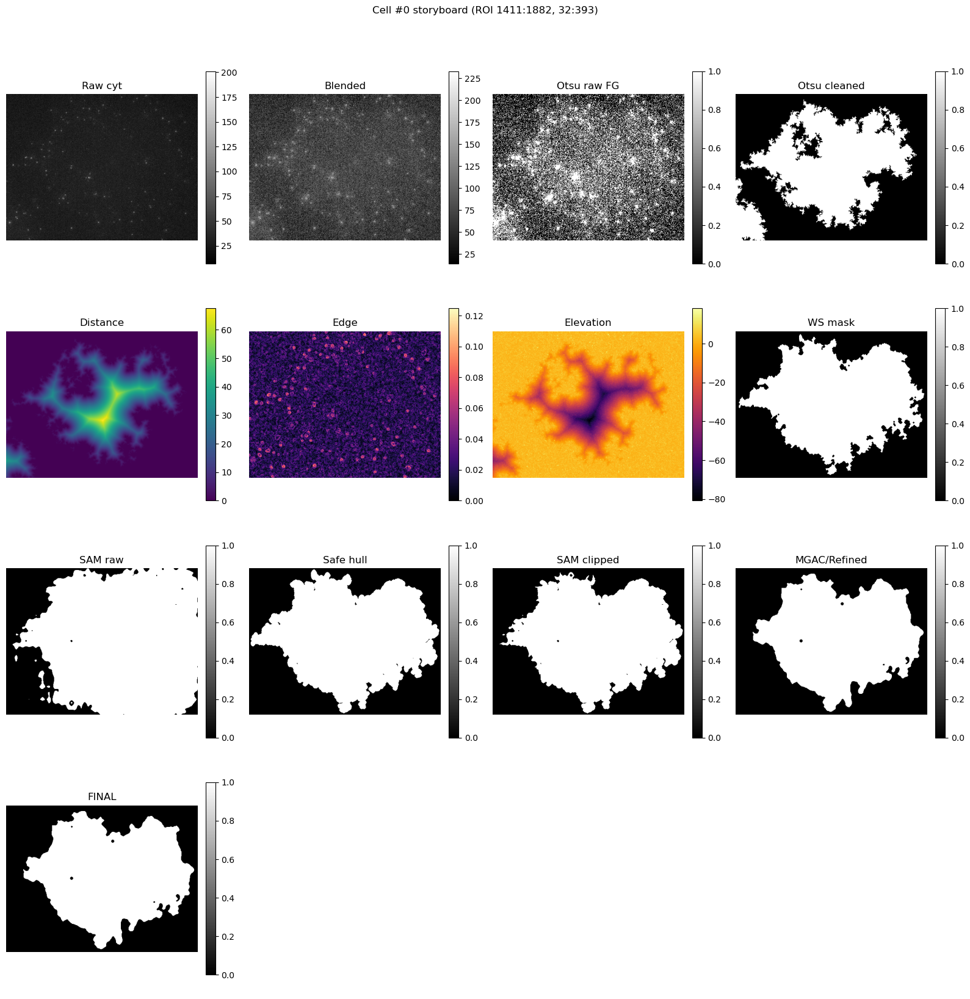

In [ ]:
# ===========================================================
# Full DEBUG pipeline with visualizations for each step
# ===========================================================

import inspect
import pathlib
import numpy as np
import cv2, tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation, exposure, color
from skimage.measure import shannon_entropy
from skimage.restoration import estimate_sigma
from scipy import ndimage as ndi

# -------- Optional MGAC (auto-disable if not installed) --------
USE_MGAC = True
try:
    from skimage.segmentation import (
        morphological_geodesic_active_contour as MGAC,
        inverse_gaussian_gradient,
    )
except Exception:
    USE_MGAC = False

# -------- Tunables (same meaning as before) --------
SEED_RADIUS = 4
SAFE_HULL_DILATION = 4
AREA_OVER = 2.2
AREA_UNDER = 0.30
CLOSE_FOOT = 2
OPEN_FOOT  = 1
PAD_BOX = 8
MIN_OBJ = 200
WS_MIN_HOLE = 1000
WS_MIN_OBJ  = 1000
W_DIST, W_EDGE, W_TEX = 1.2, 2.5, 0.4
H_MINIMA = 0.0

MGAC_ITERS, MGAC_SMOOTH, MGAC_BALLOON, MGAC_SIGMA, MGAC_PAD = 25, 2, -0.3, 1.2, 6

# ---------------- Helpers ----------------
def to_binary_2d(arr, name="mask"):
    if arr is None: raise ValueError(f"{name} is None")
    a = np.asarray(arr).squeeze()
    if a.ndim == 3: a = a.max(axis=0)
    if a.ndim != 2: raise ValueError(f"{name} must be 2-D after squeeze; got {a.shape}")
    return (a > 0)

def normalize_to_uint8(img):
    img = img.astype(np.float32); img -= img.min()
    mx = img.max();  img = (img/mx*255.0) if mx>0 else img
    return img.astype(np.uint8)

def mask_to_bbox(mask):
    m = to_binary_2d(mask, "mask_to_bbox_input")
    ys, xs = np.where(m)
    if xs.size == 0: return None
    return (int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max()))

def pad_box_xyxy(b, pad=PAD_BOX, shape=None):
    if b is None: return None
    x1,y1,x2,y2 = map(int, b)
    H,W = shape if shape is not None else (2048,2048)
    return [max(0,x1-pad), max(0,y1-pad), min(W,x2+pad), min(H,y2+pad)]

def expected_area_from_ws(ws_masks):
    vals = [int(to_binary_2d(m).sum()) for m in ws_masks if m is not None]
    return np.median(vals) if vals else None

# -------- Adaptive preprocessing (with parameter report) --------
def auto_params(img8):
    p1, p99 = np.percentile(img8, [1,99]); spread = float(max(1.0, p99-p1))
    ent = float(shannon_entropy(img8))
    edged = float((filters.sobel(img8) > 0.05).mean())
    sig_est = float(estimate_sigma(img8, channel_axis=None, average_sigmas=True))

    clip = np.interp(spread, [20,80], [6.0,3.0]) + np.interp(ent,[3.5,7.0],[0.5,-0.5])
    clip = float(np.clip(clip, 3.0, 6.0))
    sigma_color = float(np.clip(sig_est + 3.0, 3.0, 15.0))
    sigma_space = int(np.clip(np.interp(edged, [0.03,0.12], [17,9]), 9, 17))
    w_edge = float(np.clip(1.0 - 5.0*edged, 0.25, 0.8))

    return {
        "p1":p1, "p99":p99, "spread":spread, "entropy":ent, "edge_frac":edged, "sigma_est":sig_est,
        "clip":clip, "sigma_color":sigma_color, "sigma_space":sigma_space, "blend_w_edge":w_edge
    }

def clahe_filter(img8, clip_limit, tile_size=(8,8)):
    return cv2.createCLAHE(clipLimit=float(clip_limit), tileGridSize=tile_size).apply(img8)

def adaptive_preprocess(ch_uint8):
    params = auto_params(ch_uint8)
    clahe = clahe_filter(ch_uint8, clip_limit=params["clip"])
    bilat = cv2.bilateralFilter(clahe, d=9, sigmaColor=params["sigma_color"], sigmaSpace=params["sigma_space"],
                                borderType=cv2.BORDER_REFLECT_101)
    edge_pres = cv2.edgePreservingFilter(clahe, flags=1, sigma_s=max(10, params["sigma_space"]), sigma_r=0.4)
    s_space_weak = max(5, params["sigma_space"] - 6)
    bilat_edge = cv2.edgePreservingFilter(bilat, flags=1, sigma_s=s_space_weak, sigma_r=0.4)

    lap = cv2.Laplacian(ch_uint8, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    blended = cv2.addWeighted(bilat, params["blend_w_edge"], lap, 1.0-params["blend_w_edge"], 0)

    rgb = np.stack([blended, edge_pres, bilat_edge], axis=-1)
    return {"clahe":clahe,"bilat":bilat,"edge_pres":edge_pres,"bilat_edge":bilat_edge,"blended":blended,"rgb":rgb}, params

# -------- Watershed (returns debug maps) --------
def watershed_labels_debug(cyt_img_uint8, centers):
    thr = filters.threshold_otsu(cyt_img_uint8)
    binary_raw = cyt_img_uint8 > thr
    binary = morphology.remove_small_holes(binary_raw, area_threshold=WS_MIN_HOLE)
    binary = morphology.remove_small_objects(binary, min_size=WS_MIN_OBJ)
    dist = ndi.distance_transform_edt(binary)

    g = cv2.GaussianBlur(cyt_img_uint8, (0,0), 1.2)
    edge = filters.scharr(g)
    if H_MINIMA > 0: edge = morphology.h_minima(edge, H_MINIMA)
    tex = filters.laplace(filters.gaussian(cyt_img_uint8.astype(np.float32), 1.0))

    markers = np.zeros_like(cyt_img_uint8, dtype=np.int32)
    for i,(cx,cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img_uint8.shape[0] and 0 <= xi < cyt_img_uint8.shape[1]:
            cv2.circle(markers, (xi, yi), SEED_RADIUS, int(i), -1)

    elev = -W_DIST*dist + W_EDGE*edge + W_TEX*np.abs(tex)
    labels = segmentation.watershed(elev, markers=markers, mask=binary)

    debug = {
        "thr":thr, "binary_raw":binary_raw.astype(np.uint8), "binary":binary.astype(np.uint8),
        "dist":dist, "edge":edge, "tex":tex, "elev":elev, "markers":markers
    }
    return labels, debug

def labels_to_masks(labels, n):
    return [(labels == i).astype(np.uint8) for i in range(1, n+1)]

# -------- Post / refine --------
def postproc_mask(m):
    m = to_binary_2d(m)
    m = morphology.remove_small_objects(m, min_size=MIN_OBJ)
    m = morphology.binary_closing(m, footprint=morphology.disk(CLOSE_FOOT))
    m = morphology.binary_opening(m, footprint=morphology.disk(OPEN_FOOT))
    return m.astype(np.uint8)

def safe_hull(mask, dil=SAFE_HULL_DILATION):
    m = to_binary_2d(mask)
    return morphology.binary_dilation(m, footprint=morphology.disk(dil)).astype(np.uint8)

def clip_to_mask(sam_mask, hull):
    m1 = to_binary_2d(sam_mask); m2 = to_binary_2d(hull)
    return (m1 & m2).astype(np.uint8)

def area_refine(mask, expected_area):
    m = to_binary_2d(mask);  a = int(m.sum())
    if expected_area is not None:
        if a > AREA_OVER*expected_area:
            m = morphology.binary_erosion(m, footprint=morphology.disk(1))
        elif a < AREA_UNDER*expected_area:
            m = morphology.binary_dilation(m, footprint=morphology.disk(1))
    m = morphology.binary_closing(m, footprint=morphology.disk(2))
    m = morphology.binary_opening(m, footprint=morphology.disk(1))
    return m.astype(np.uint8)

def mgac_snap_local(full_img_uint8, mask_full, bbox_xyxy):
    if not USE_MGAC: return to_binary_2d(mask_full).astype(np.uint8)
    M = to_binary_2d(mask_full).astype(np.uint8)
    H,W = M.shape; x1,y1,x2,y2 = map(int, bbox_xyxy)
    x1p,y1p = max(0,x1-MGAC_PAD), max(0,y1-MGAC_PAD)
    x2p,y2p = min(W,x2+MGAC_PAD), min(H,y2+MGAC_PAD)
    roi_img = full_img_uint8[y1p:y2p, x1p:x2p]
    roi_msk = M[y1p:y2p, x1p:x2p].astype(np.float32)

    roi = roi_img.astype(np.float32)
    if roi.max()>0: roi/=roi.max()
    gimg = inverse_gaussian_gradient(cv2.GaussianBlur(roi,(0,0),MGAC_SIGMA))

    sig = inspect.signature(MGAC).parameters
    kwargs = dict(init_level_set=roi_msk, smoothing=MGAC_SMOOTH, balloon=MGAC_BALLOON)
    if "num_iter" in sig: kwargs["num_iter"] = MGAC_ITERS
    else:                 kwargs["iterations"] = MGAC_ITERS
    ls = MGAC(gimg, **kwargs)
    roi_refined = (ls>0).astype(np.uint8)

    out = np.zeros_like(M, dtype=np.uint8)
    out[y1p:y2p, x1p:x2p] = roi_refined
    return out

# --------- Main processing (returns debug dicts too) ---------
def process_image_debug(image_path, fish):
    with tifffile.TiffFile(image_path) as tif:
        n_pages = len(tif.pages)
        if n_pages < 3: raise ValueError(f"Expected ≥3 pages (got {n_pages})")
        cyt     = tif.pages[min(1, n_pages-1)].asarray()
        nucleus = tif.pages[min(2, n_pages-1)].asarray()

    cyt8 = normalize_to_uint8(cyt)
    H,W = cyt8.shape

    P, params = adaptive_preprocess(cyt8)

    bbox_nucleus = fish.AppIntDINOwrapper(nucleus)
    centers = [((x1+x2)/2.0, (y1+y2)/2.0) for (x1,y1,x2,y2) in bbox_nucleus]
    nC = len(centers)

    labels_b, dbg_b  = watershed_labels_debug(P["blended"],    centers)
    labels_e, dbg_e  = watershed_labels_debug(P["edge_pres"],  centers)
    labels_be, dbg_be= watershed_labels_debug(P["bilat_edge"], centers)

    ws_b  = [postproc_mask(m) for m in labels_to_masks(labels_b,  nC)]
    ws_e  = [postproc_mask(m) for m in labels_to_masks(labels_e,  nC)]
    ws_be = [postproc_mask(m) for m in labels_to_masks(labels_be, nC)]

    ws_cons = []
    for i in range(nC):
        stack = np.stack([to_binary_2d(ws_b[i]), to_binary_2d(ws_e[i]), to_binary_2d(ws_be[i])], axis=0)
        mv = (stack.sum(axis=0) >= 2).astype(np.uint8)
        ws_cons.append(mv if mv.any() else max([ws_b[i], ws_e[i], ws_be[i]], key=lambda m: int(to_binary_2d(m).sum())))

    exp_area = expected_area_from_ws(ws_cons)

    bbox_cyto = []
    for i, m in enumerate(ws_cons):
        b = mask_to_bbox(m)
        if b is None and i < len(bbox_nucleus): b = bbox_nucleus[i]
        bbox_cyto.append(pad_box_xyxy(b, PAD_BOX, shape=cyt8.shape) if b is not None else None)
    valid_idx = [i for i,b in enumerate(bbox_cyto) if b is not None]
    bbox_cyto_valid = [bbox_cyto[i] for i in valid_idx]

    sam_best = [None]*nC
    sam_raw_list = [None]*nC
    if bbox_cyto_valid:
        sam_masks = fish.finetune.AppIntPREDICTCytoplasmWrapper(P["rgb"], bbox_cyto_valid)
        k=0
        for i in range(nC):
            if bbox_cyto[i] is None: continue
            m = to_binary_2d(sam_masks[k]).astype(np.uint8)
            sam_best[i] = m
            sam_raw_list[i] = m
            k += 1

    hulls   = []
    clipped = []
    mgac_out= []
    finals  = []
    for i in range(nC):
        ws = ws_cons[i]; sm = sam_best[i]
        if sm is None or not sm.any():
            hulls.append(None); clipped.append(None); mgac_out.append(None); finals.append(ws); continue
        h  = safe_hull(ws, SAFE_HULL_DILATION)
        c  = clip_to_mask(sm, h)
        r  = area_refine(c, exp_area)
        if USE_MGAC and bbox_cyto[i] is not None:
            r2 = mgac_snap_local(P["blended"], r, bbox_cyto[i])
        else:
            r2 = r
        if exp_area is not None:
            a = int(r2.sum())
            if a > AREA_OVER*exp_area or a < AREA_UNDER*exp_area:
                r2 = ws
        hulls.append(h); clipped.append(c); mgac_out.append(r2 if r2 is not None else r)
        finals.append((r2 if r2 is not None else r).astype(np.uint8))

    res = {
        "cyt8":cyt8, "centers":centers, "bbox_cyto":[b for b in bbox_cyto if b is not None],
        "ws_masks":ws_cons, "final_masks":finals
    }
    debug = {
        "params":params, "preproc":P,
        "ws_dbg":{"blended":dbg_b, "edge_pres":dbg_e, "bilat_edge":dbg_be},
        "labels":{"blended":labels_b, "edge_pres":labels_e, "bilat_edge":labels_be},
        "ws_variants":{"b":ws_b, "e":ws_e, "be":ws_be},
        "sam_raw":sam_raw_list, "hulls":hulls, "clipped":clipped, "mgac":mgac_out,
        "bbox_all":bbox_cyto
    }
    return res, debug

# ------------- Global visual checks -------------
def imshow_cbar(ax, img, title, cmap="gray"):
    im = ax.imshow(img, cmap=cmap)
    ax.set_title(title); ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

def show_params(params):
    print("\n[Auto-params]")
    for k,v in params.items():
        if isinstance(v, float): print(f"{k:>14s}: {v:.4f}")
        else:                    print(f"{k:>14s}: {v}")

def show_preprocessing(P, cyt8):
    fig, ax = plt.subplots(2,3, figsize=(14,9))
    ax = ax.ravel()
    ax[0].imshow(cyt8, cmap="gray"); ax[0].set_title("Raw (uint8)"); ax[0].axis("off")
    ax[1].imshow(P["clahe"], cmap="gray"); ax[1].set_title("CLAHE"); ax[1].axis("off")
    ax[2].imshow(P["bilat"], cmap="gray"); ax[2].set_title("Bilateral"); ax[2].axis("off")
    ax[3].imshow(P["edge_pres"], cmap="gray"); ax[3].set_title("Edge-preserving"); ax[3].axis("off")
    ax[4].imshow(P["bilat_edge"], cmap="gray"); ax[4].set_title("Bilateral→EdgePres"); ax[4].axis("off")
    ax[5].imshow(P["blended"], cmap="gray"); ax[5].set_title("Blended (bilat + laplace)"); ax[5].axis("off")
    plt.tight_layout(); plt.show()

def show_ws_debug(cyt_variant, wsdbg, centers, title_prefix="WS on blended"):
    fig, ax = plt.subplots(2,3, figsize=(14,9))
    imshow_cbar(ax[0,0], cyt_variant, f"{title_prefix}: input", "gray")
    ax[0,1].imshow(wsdbg["binary_raw"], cmap="gray"); ax[0,1].set_title("Otsu FG/BG (raw)"); ax[0,1].axis("off")
    ax[0,2].imshow(wsdbg["binary"], cmap="gray"); ax[0,2].set_title("Cleaned FG (holes/objects)"); ax[0,2].axis("off")
    imshow_cbar(ax[1,0], wsdbg["dist"], "Distance map", "viridis")
    imshow_cbar(ax[1,1], wsdbg["edge"], "Edge (Scharr)", "magma")
    imshow_cbar(ax[1,2], wsdbg["elev"], "Elevation = -Wdist + Wedge + Wtex", "inferno")
    for (cx,cy) in centers:
        ax[1,2].add_patch(Circle((cx,cy), radius=5, color="lime", fill=True))
    plt.tight_layout(); plt.show()

def show_ws_labels(labels, title="Watershed labels (blended)"):
    lab_vis = color.label2rgb(labels, bg_label=0, bg_color=(0,0,0), alpha=0.3)
    plt.figure(figsize=(6,6)); plt.imshow(lab_vis); plt.title(title); plt.axis("off"); plt.show()

def show_ws_vs_final(res, title_left="Final: WS→SAM", title_right="WS consensus"):
    cyt = res["cyt8"]; ws_masks = res["ws_masks"]; final_masks = res["final_masks"]
    bbox_cyto = res.get("bbox_cyto", []); centers = res.get("centers", [])
    bg = (exposure.equalize_adapthist(cyt, clip_limit=0.02)*255).astype(np.uint8)

    fig, ax = plt.subplots(1,2, figsize=(16,8))
    ax[0].imshow(bg, cmap="gray"); ax[0].set_title(title_left); ax[0].axis("off")
    for b in bbox_cyto:
        x1,y1,x2,y2 = map(int,b)
        ax[0].add_patch(Rectangle((x1,y1), x2-x1, y2-y1, edgecolor="deepskyblue",
                                  facecolor="none", linestyle="--", linewidth=2.0))
    for m in final_masks:
        if m is None: continue
        for c in measure.find_contours(m>0, 0.5):
            ax[0].plot(c[:,1], c[:,0], color="orange", linewidth=1.6)

    ax[1].imshow(bg, cmap="gray"); ax[1].set_title(title_right); ax[1].axis("off")
    for m in ws_masks:
        if m is None: continue
        for c in measure.find_contours(m>0, 0.5):
            ax[1].plot(c[:,1], c[:,0], color="magenta", linewidth=1.6)
    for (cx,cy) in centers:
        ax[0].add_patch(Circle((cx,cy), 5, color="lime", fill=True))
        ax[1].add_patch(Circle((cx,cy), 5, color="lime", fill=True))
    plt.tight_layout(); plt.show()

# ------------- Per-cell storyboard (ROI) -------------
def show_cell_storyboard(idx, res, debug):
    cyt = res["cyt8"]; H,W = cyt.shape
    P = debug["preproc"]; wsdbg = debug["ws_dbg"]["blended"]
    bbox_all = debug["bbox_all"]
    ws_masks = res["ws_masks"]; final_masks = res["final_masks"]
    sam_raw = debug["sam_raw"]; hulls = debug["hulls"]; clipped = debug["clipped"]; mgac = debug["mgac"]

    if idx >= len(bbox_all) or bbox_all[idx] is None:
        print(f"[WARN] Cell {idx} has no bbox."); return
    x1,y1,x2,y2 = map(int, bbox_all[idx])
    x1,y1 = max(0,x1),max(0,y1); x2,y2 = min(W,x2),min(H,y2)

    def crop(m):
        if m is None: return None
        return np.asarray(m)[y1:y2, x1:x2]

    panels = [
        ("Raw cyt", cyt[y1:y2, x1:x2], "gray"),
        ("Blended", P["blended"][y1:y2, x1:x2], "gray"),
        ("Otsu raw FG", wsdbg["binary_raw"][y1:y2, x1:x2], "gray"),
        ("Otsu cleaned", wsdbg["binary"][y1:y2, x1:x2], "gray"),
        ("Distance", wsdbg["dist"][y1:y2, x1:x2], "viridis"),
        ("Edge", wsdbg["edge"][y1:y2, x1:x2], "magma"),
        ("Elevation", wsdbg["elev"][y1:y2, x1:x2], "inferno"),
        ("WS mask", crop(ws_masks[idx]), "gray"),
        ("SAM raw", crop(sam_raw[idx]), "gray"),
        ("Safe hull", crop(hulls[idx]), "gray"),
        ("SAM clipped", crop(clipped[idx]), "gray"),
        ("MGAC/Refined", crop(mgac[idx]) if USE_MGAC else crop(clipped[idx]), "gray"),
        ("FINAL", crop(final_masks[idx]), "gray"),
    ]

    n = len(panels)
    cols = 4; rows = (n+cols-1)//cols
    fig, ax = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    ax = np.array(ax).reshape(-1)
    for i,(t,im,cm) in enumerate(panels):
        if im is None: 
            ax[i].set_title(t+" (None)"); ax[i].axis("off"); continue
        imshow_cbar(ax[i], im, t, cm)
    for j in range(i+1, rows*cols):
        ax[j].axis("off")
    plt.suptitle(f"Cell #{idx} storyboard (ROI {x1}:{x2}, {y1}:{y2})", y=1.02, fontsize=12)
    plt.tight_layout(); plt.show()

# ----------------------- Run -----------------------
if __name__ == "__main__":
    # 1) Load your Fish class (provides DINO + SAM wrappers)
    from fishCore import Fish

    # >>>>>> EDIT THESE <<<<<<
    CFG_PATH   = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\config.ini"
    IMAGE_PATH = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\kayleigh_composite\488_pb5sp5_s5.composite.tif"
    MODEL_VER  = "3.50"

    fish = Fish(config=pathlib.Path(CFG_PATH))
    fish.set_model_version(MODEL_VER)

    # 2) Run processing WITH DEBUG
    res, dbg = process_image_debug(IMAGE_PATH, fish)

    # 3) Print adaptive parameters
    show_params(dbg["params"])

    # 4) Global: see all preprocessing variants
    show_preprocessing(dbg["preproc"], res["cyt8"])

    # 5) Watershed maps for the blended variant
    show_ws_debug(dbg["preproc"]["blended"], dbg["ws_dbg"]["blended"], res["centers"],
                  title_prefix="WS on blended")

    # 6) Watershed labels (color overlay)
    show_ws_labels(dbg["labels"]["blended"], title="Watershed labels (blended)")

    # 7) Summary: Final vs WS-only
    show_ws_vs_final(res)

    # 8) Per-cell storyboard (change idx to inspect another cell)
    show_cell_storyboard(idx=0, res=res, debug=dbg)


[INFO] Loading C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\kayleigh_composite\488_pb5sp5_s5.composite.tif
[DEBUG] raw mask: shape=(2048, 2048), dtype=uint8, unique=[0 1]...
[DEBUG] refined mask: shape=(2048, 2048), dtype=uint8, unique=[0 1]...


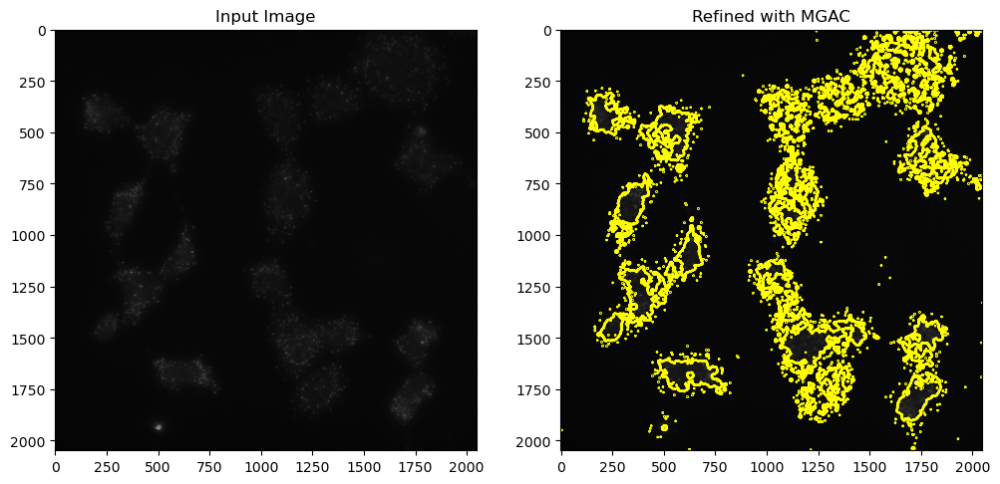

In [ ]:
import numpy as np
import cv2
import pathlib
import matplotlib.pyplot as plt
from skimage import morphology, measure
from skimage.segmentation import (
    morphological_geodesic_active_contour as MGAC,
    inverse_gaussian_gradient,
)
import inspect

# =====================================================
# Debug helpers
# =====================================================
def debug_shape(name, arr):
    if arr is None:
        print(f"[DEBUG] {name}: None")
    else:
        print(f"[DEBUG] {name}: shape={arr.shape}, dtype={arr.dtype}, unique={np.unique(arr)[:5]}...")

def to_binary_2d(mask):
    """Force any mask into 2D binary {0,1} array."""
    if mask is None:
        return np.zeros((1, 1), np.uint8)
    arr = np.asarray(mask)
    if arr.ndim > 2:
        arr = arr.squeeze()
    arr = (arr > 0).astype(np.uint8)
    return arr

# =====================================================
# MGAC snap (fixed kwarg handling)
# =====================================================
USE_MGAC = True
MGAC_ITERS = 40
MGAC_SIGMA = 1.0
MGAC_SMOOTH = 1
MGAC_BALLOON = -1

def mgac_snap(img_uint8, mask):
    """Edge-snap with MGAC, robust to skimage API differences."""
    if not USE_MGAC:
        return to_binary_2d(mask).astype(np.uint8)

    # 1) prep image in [0,1] float
    img = np.asarray(img_uint8).astype(np.float32)
    if img.max() > 0:
        img = img / img.max()

    # edge map
    gimg = inverse_gaussian_gradient(
        cv2.GaussianBlur(img, (0, 0), MGAC_SIGMA)
    )

    # 2) init level set (2-D float)
    init_ls = to_binary_2d(mask).astype(np.float32)

    # 3) call MGAC with correct kwarg
    sig = inspect.signature(MGAC).parameters
    kwargs = dict(
        init_level_set=init_ls,
        smoothing=MGAC_SMOOTH,
        balloon=MGAC_BALLOON,
    )
    if "num_iter" in sig:
        kwargs["num_iter"] = MGAC_ITERS
    else:
        kwargs["iterations"] = MGAC_ITERS

    ls = MGAC(gimg, **kwargs)
    return (ls > 0).astype(np.uint8)

# =====================================================
# Example process pipeline (simplified)
# =====================================================
def process_image(path, fish=None):
    print(f"[INFO] Loading {path}")
    img = cv2.imread(str(path), -1)

    if img is None:
        raise FileNotFoundError(path)

    img_uint8 = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # dummy nucleus detection (replace with DINO)
    _, mask = cv2.threshold(img_uint8, 0, 1, cv2.THRESH_OTSU)

    debug_shape("raw mask", mask)

    # refine with MGAC
    refined = mgac_snap(img_uint8, mask)
    debug_shape("refined mask", refined)

    return dict(
        blended=img_uint8,
        nucleus_mask=mask,
        refined_mask=refined,
    )

# =====================================================
# Visualization
# =====================================================
def show_result_with_boxes(res):
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    ax[0].imshow(res["blended"], cmap="gray")
    ax[0].set_title("Input Image")

    ax[1].imshow(res["blended"], cmap="gray")
    ax[1].contour(res["refined_mask"], colors="yellow")
    ax[1].set_title("Refined with MGAC")

    plt.show()

# =====================================================
# Run example
# =====================================================
if __name__ == "__main__":
    IMAGE_PATH = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\kayleigh_composite\488_pb5sp5_s5.composite.tif"

    res = process_image(IMAGE_PATH)
    show_result_with_boxes(res)


## Testing with Vadym's images


final text_encoder_type: bert-base-uncased


[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:15:41,685][INFO] CHECK: Model version 3.50 loaded


[CYTO] Starting prediction for 10 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [1520, 948, 1783, 1204]
[CYTO] Processing box [1596, 459, 1919, 611]
[CYTO] Processing box [1439, 1417, 1575, 1551]
[CYTO] Processing box [995, 447, 1156, 684]
[CYTO] Processing box [357, 1555, 541, 1797]
[CYTO] Processing box [591, 1266, 827, 1513]
[CYTO] Processing box [636, 57, 778, 254]
[CYTO] Processing box [99, 1340, 425, 1513]
[CYTO] Processing box [313, 438, 466, 571]
[CYTO] Processing box [370, 581, 572, 913]

[Auto-params]
            p1: 14.0000
           p99: 44.0000
        spread: 30.0000
       entropy: 4.4893
     edge_frac: 0.0059
     sigma_est: 4.9226
          clip: 5.7173
   sigma_color: 7.9226
   sigma_space: 17
  blend_w_edge: 0.8000


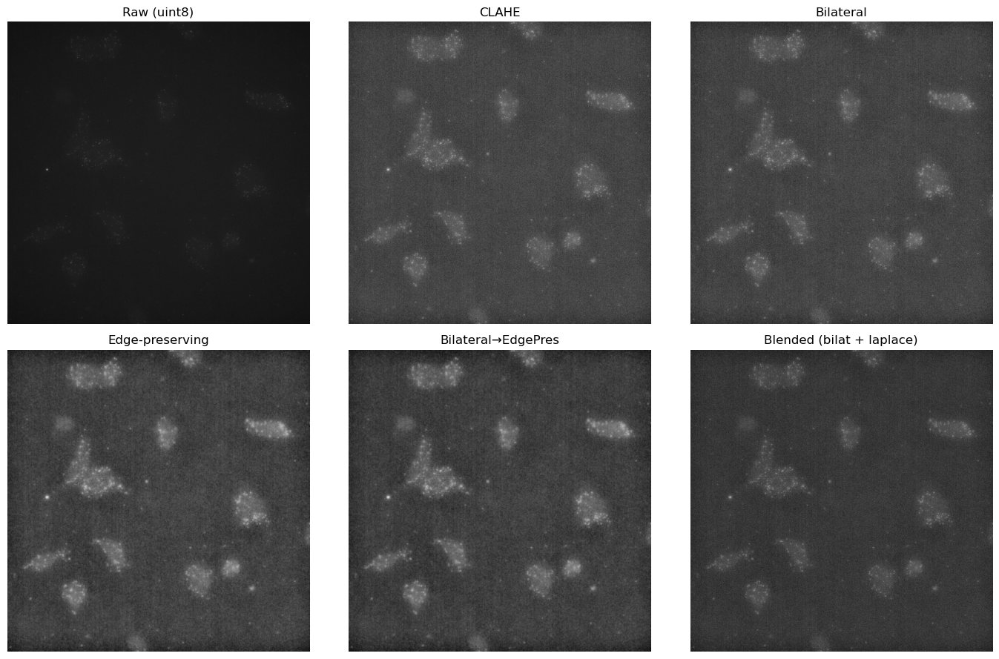

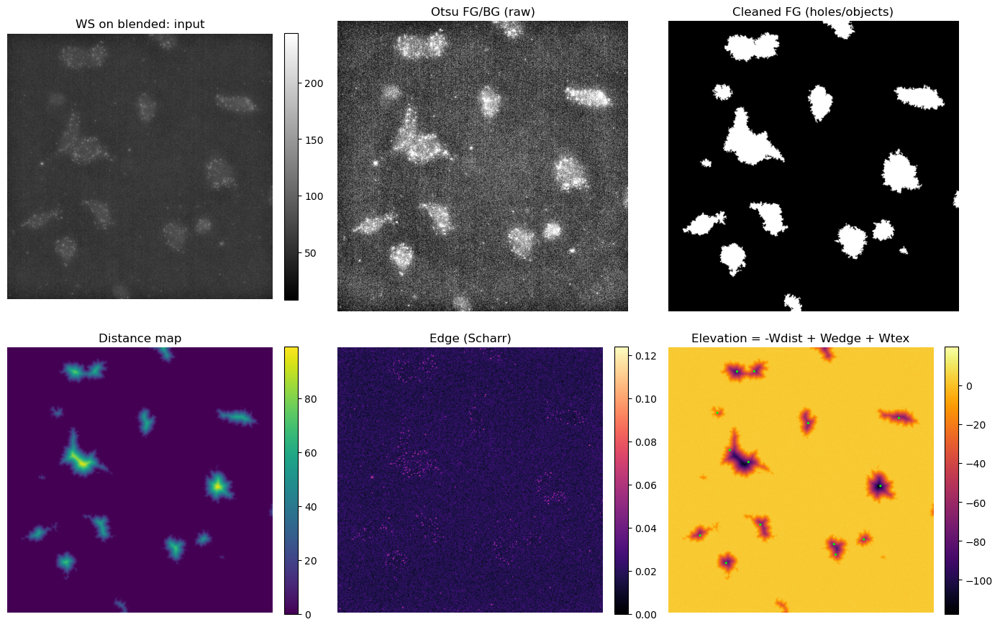

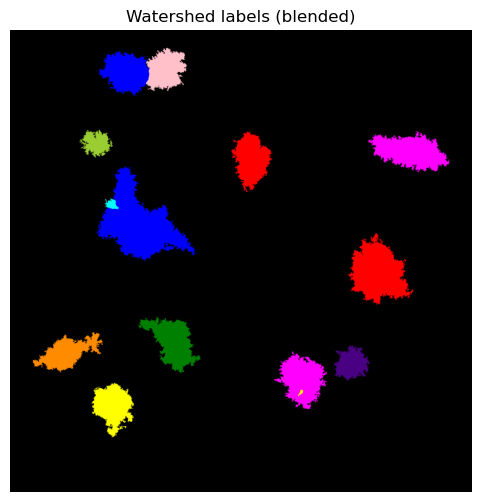

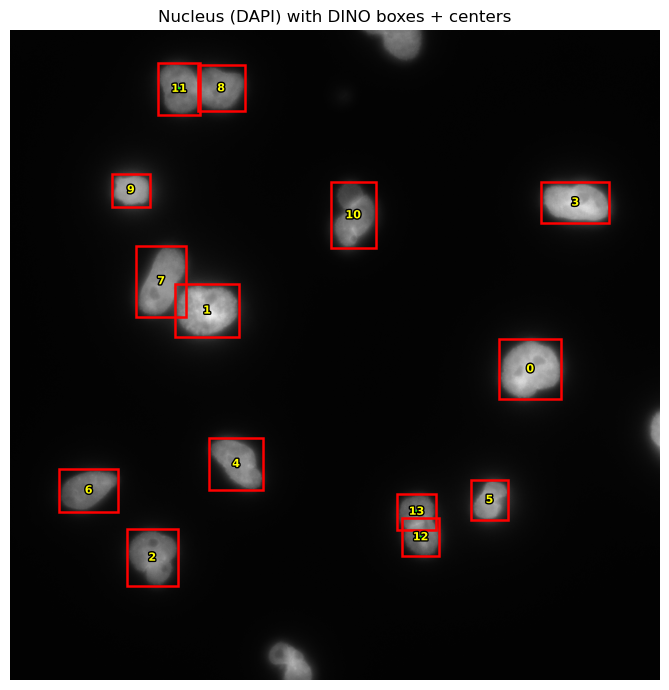

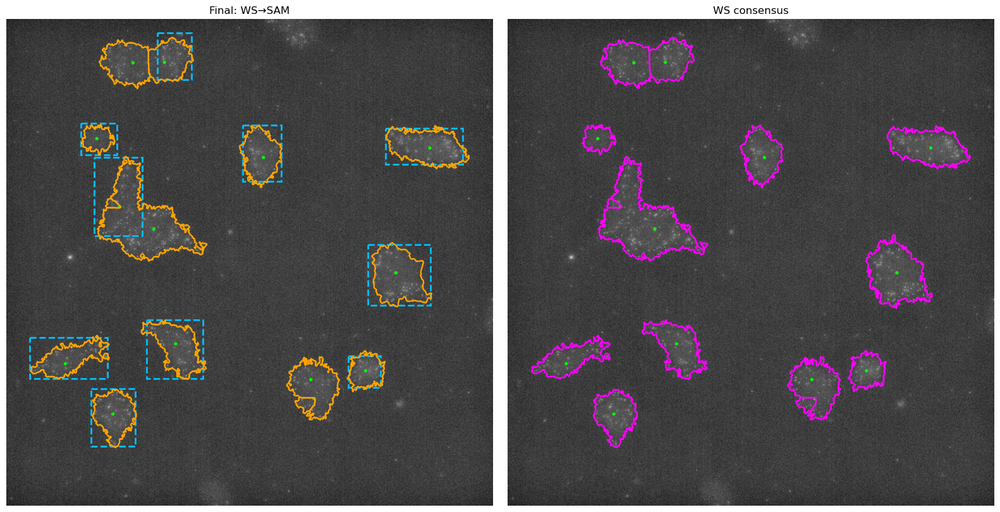

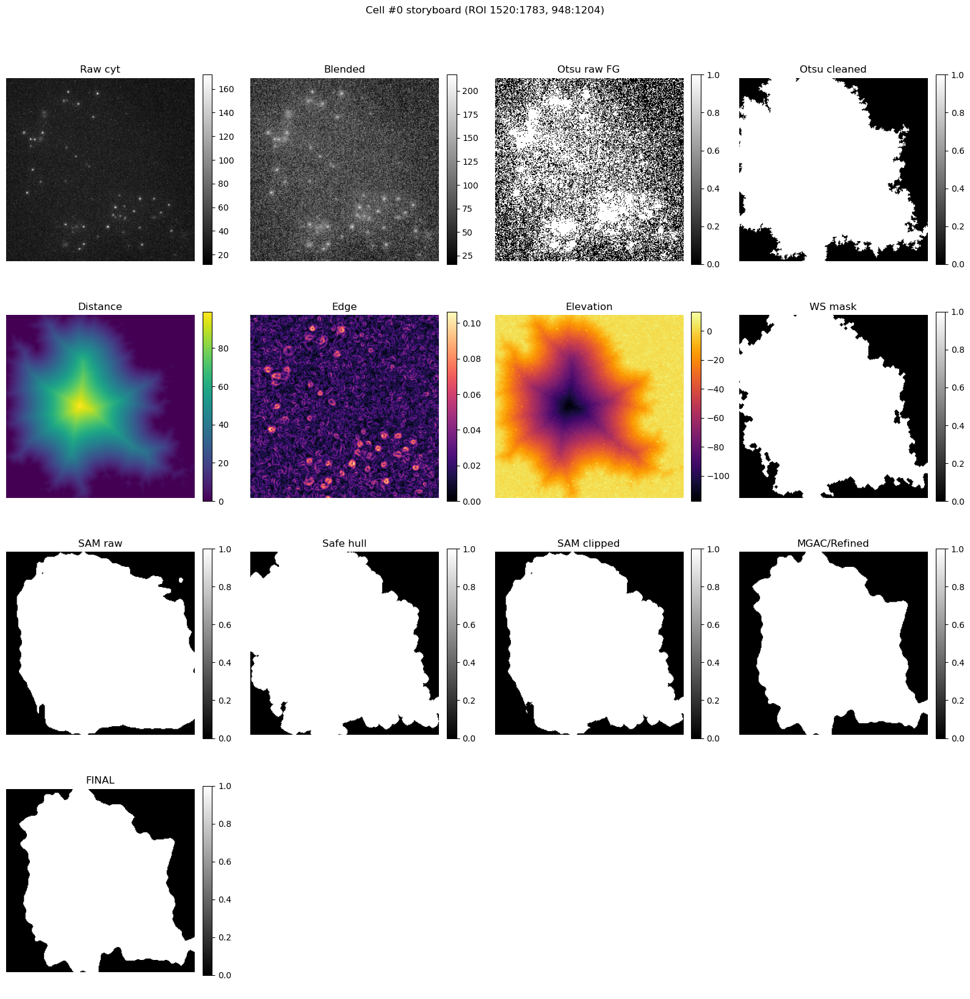

In [ ]:
# ===========================================================
# Full DEBUG pipeline (two paths): 488 cytoplasm + DAPI nucleus
# ===========================================================

import inspect
import pathlib
import numpy as np
import cv2, tifffile
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
from skimage import filters, morphology, measure, segmentation, exposure, color
from skimage.measure import shannon_entropy
from skimage.restoration import estimate_sigma
from skimage.feature import peak_local_max
from scipy import ndimage as ndi

# -------- Optional MGAC (auto-disable if not installed) --------
USE_MGAC = True
try:
    from skimage.segmentation import (
        morphological_geodesic_active_contour as MGAC,
        inverse_gaussian_gradient,
    )
except Exception:
    USE_MGAC = False

# -------- Tunables (same meaning as before) --------
SEED_RADIUS = 4
SAFE_HULL_DILATION = 4
AREA_OVER = 2.2
AREA_UNDER = 0.30
CLOSE_FOOT = 2
OPEN_FOOT  = 1
PAD_BOX = 8
MIN_OBJ = 200
WS_MIN_HOLE = 1000
WS_MIN_OBJ  = 1000
W_DIST, W_EDGE, W_TEX = 1.2, 2.5, 0.4
H_MINIMA = 0.0

MGAC_ITERS, MGAC_SMOOTH, MGAC_BALLOON, MGAC_SIGMA, MGAC_PAD = 25, 2, -0.3, 1.2, 6

# ---------------- Helpers ----------------
def to_binary_2d(arr, name="mask"):
    if arr is None: raise ValueError(f"{name} is None")
    a = np.asarray(arr).squeeze()
    if a.ndim == 3: a = a.max(axis=0)
    if a.ndim != 2: raise ValueError(f"{name} must be 2-D after squeeze; got {a.shape}")
    return (a > 0)

def normalize_to_uint8(img):
    img = img.astype(np.float32); img -= img.min()
    mx = img.max();  img = (img/mx*255.0) if mx>0 else img
    return img.astype(np.uint8)

def read_gray(path):
    """Read a single-channel image from path; if multi-channel, pick a reasonable channel."""
    arr = tifffile.imread(path)
    a = np.asarray(arr)
    if a.ndim == 2:
        return a
    # try (H,W,C)
    if a.ndim == 3 and a.shape[-1] <= 4 and a.shape[0] > 8 and a.shape[1] > 8:
        # prefer channel 1 then 0
        c = min(1, a.shape[-1]-1)
        return a[..., c]
    # try (C,H,W)
    if a.ndim == 3 and a.shape[0] <= 4:
        c = min(1, a.shape[0]-1)
        return a[c, ...]
    # fallback to max over channels
    return a.max(axis=-1) if a.ndim == 3 else a.squeeze()

def mask_to_bbox(mask):
    m = to_binary_2d(mask, "mask_to_bbox_input")
    ys, xs = np.where(m)
    if xs.size == 0: return None
    return (int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max()))

def pad_box_xyxy(b, pad=PAD_BOX, shape=None):
    if b is None: return None
    x1,y1,x2,y2 = map(int, b)
    H,W = shape if shape is not None else (2048,2048)
    return [max(0,x1-pad), max(0,y1-pad), min(W,x2+pad), min(H,y2+pad)]

def expected_area_from_ws(ws_masks):
    vals = [int(to_binary_2d(m).sum()) for m in ws_masks if m is not None]
    return np.median(vals) if vals else None

def gradient(channel, ksize=5):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (ksize, ksize))
    return cv2.morphologyEx(channel, cv2.MORPH_GRADIENT, kernel)

# -------- Adaptive preprocessing (with parameter report) --------
def auto_params(img8):
    p1, p99 = np.percentile(img8, [1,99]); spread = float(max(1.0, p99-p1))
    ent = float(shannon_entropy(img8))
    edged = float((filters.sobel(img8) > 0.05).mean())
    sig_est = float(estimate_sigma(img8, channel_axis=None, average_sigmas=True))

    clip = np.interp(spread, [20,80], [6.0,3.0]) + np.interp(ent,[3.5,7.0],[0.5,-0.5])
    clip = float(np.clip(clip, 3.0, 6.0))
    sigma_color = float(np.clip(sig_est + 3.0, 3.0, 15.0))
    sigma_space = int(np.clip(np.interp(edged, [0.03,0.12], [17,9]), 9, 17))
    w_edge = float(np.clip(1.0 - 5.0*edged, 0.25, 0.8))

    return {
        "p1":p1, "p99":p99, "spread":spread, "entropy":ent, "edge_frac":edged, "sigma_est":sig_est,
        "clip":clip, "sigma_color":sigma_color, "sigma_space":sigma_space, "blend_w_edge":w_edge
    }

def clahe_filter(img8, clip_limit, tile_size=(8,8)):
    return cv2.createCLAHE(clipLimit=float(clip_limit), tileGridSize=tile_size).apply(img8)

def adaptive_preprocess(ch_uint8):
    params = auto_params(ch_uint8)
    clahe = clahe_filter(ch_uint8, clip_limit=params["clip"])
    bilat = cv2.bilateralFilter(clahe, d=9, sigmaColor=params["sigma_color"], sigmaSpace=params["sigma_space"],
                                borderType=cv2.BORDER_REFLECT_101)
    edge_pres = cv2.edgePreservingFilter(clahe, flags=1, sigma_s=max(10, params["sigma_space"]), sigma_r=0.4)
    s_space_weak = max(5, params["sigma_space"] - 6)
    bilat_edge = cv2.edgePreservingFilter(bilat, flags=1, sigma_s=s_space_weak, sigma_r=0.4)

    lap = cv2.Laplacian(ch_uint8, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    blended = cv2.addWeighted(bilat, params["blend_w_edge"], lap, 1.0-params["blend_w_edge"], 0)

    rgb = np.stack([blended, edge_pres, bilat_edge], axis=-1)
    return {"clahe":clahe,"bilat":bilat,"edge_pres":edge_pres,"bilat_edge":bilat_edge,"blended":blended,"rgb":rgb}, params

# -------- Watershed (returns debug maps) --------
def watershed_labels_debug(cyt_img_uint8, centers):
    thr = filters.threshold_otsu(cyt_img_uint8)
    binary_raw = cyt_img_uint8 > thr
    binary = morphology.remove_small_holes(binary_raw, area_threshold=WS_MIN_HOLE)
    binary = morphology.remove_small_objects(binary, min_size=WS_MIN_OBJ)
    dist = ndi.distance_transform_edt(binary)

    g = cv2.GaussianBlur(cyt_img_uint8, (0,0), 1.2)
    edge = filters.scharr(g)
    if H_MINIMA > 0: edge = morphology.h_minima(edge, H_MINIMA)
    tex = filters.laplace(filters.gaussian(cyt_img_uint8.astype(np.float32), 1.0))

    markers = np.zeros_like(cyt_img_uint8, dtype=np.int32)
    for i,(cx,cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img_uint8.shape[0] and 0 <= xi < cyt_img_uint8.shape[1]:
            cv2.circle(markers, (xi, yi), SEED_RADIUS, int(i), -1)

    elev = -W_DIST*dist + W_EDGE*edge + W_TEX*np.abs(tex)
    labels = segmentation.watershed(elev, markers=markers, mask=binary)

    debug = {
        "thr":thr, "binary_raw":binary_raw.astype(np.uint8), "binary":binary.astype(np.uint8),
        "dist":dist, "edge":edge, "tex":tex, "elev":elev, "markers":markers
    }
    return labels, debug

def labels_to_masks(labels, n):
    return [(labels == i).astype(np.uint8) for i in range(1, n+1)]

# -------- Post / refine --------
def postproc_mask(m):
    m = to_binary_2d(m)
    m = morphology.remove_small_objects(m, min_size=MIN_OBJ)
    m = morphology.binary_closing(m, footprint=morphology.disk(CLOSE_FOOT))
    m = morphology.binary_opening(m, footprint=morphology.disk(OPEN_FOOT))
    return m.astype(np.uint8)

def safe_hull(mask, dil=SAFE_HULL_DILATION):
    m = to_binary_2d(mask)
    return morphology.binary_dilation(m, footprint=morphology.disk(dil)).astype(np.uint8)

def clip_to_mask(sam_mask, hull):
    m1 = to_binary_2d(sam_mask); m2 = to_binary_2d(hull)
    return (m1 & m2).astype(np.uint8)

def area_refine(mask, expected_area):
    m = to_binary_2d(mask);  a = int(m.sum())
    if expected_area is not None:
        if a > AREA_OVER*expected_area:
            m = morphology.binary_erosion(m, footprint=morphology.disk(1))
        elif a < AREA_UNDER*expected_area:
            m = morphology.binary_dilation(m, footprint=morphology.disk(1))
    m = morphology.binary_closing(m, footprint=morphology.disk(2))
    m = morphology.binary_opening(m, footprint=morphology.disk(1))
    return m.astype(np.uint8)

def mgac_snap_local(full_img_uint8, mask_full, bbox_xyxy):
    if not USE_MGAC: return to_binary_2d(mask_full).astype(np.uint8)
    M = to_binary_2d(mask_full).astype(np.uint8)
    H,W = M.shape; x1,y1,x2,y2 = map(int, bbox_xyxy)
    x1p,y1p = max(0,x1-MGAC_PAD), max(0,y1-MGAC_PAD)
    x2p,y2p = min(W,x2+MGAC_PAD), min(H,y2+MGAC_PAD)
    roi_img = full_img_uint8[y1p:y2p, x1p:x2p]
    roi_msk = M[y1p:y2p, x1p:x2p].astype(np.float32)

    roi = roi_img.astype(np.float32)
    if roi.max()>0: roi/=roi.max()
    gimg = inverse_gaussian_gradient(cv2.GaussianBlur(roi,(0,0),MGAC_SIGMA))

    sig = inspect.signature(MGAC).parameters
    kwargs = dict(init_level_set=roi_msk, smoothing=MGAC_SMOOTH, balloon=MGAC_BALLOON)
    if "num_iter" in sig: kwargs["num_iter"] = MGAC_ITERS
    else:                 kwargs["iterations"] = MGAC_ITERS
    ls = MGAC(gimg, **kwargs)
    roi_refined = (ls>0).astype(np.uint8)

    out = np.zeros_like(M, dtype=np.uint8)
    out[y1p:y2p, x1p:x2p] = roi_refined
    return out

# --------- Main processing for TWO paths ---------
def process_image_debug_two_paths(cyto_path, nucleus_path, fish):
    cyt     = read_gray(cyto_path)
    nucleus = read_gray(nucleus_path)

    cyt8 = normalize_to_uint8(cyt)
    nuc8 = normalize_to_uint8(nucleus) 
    H,W = cyt8.shape

    # Adaptive preprocessing
    P, params = adaptive_preprocess(cyt8)

    # Nucleus -> DINO boxes -> centers (fallback to peaks if no boxes)
    bbox_nucleus = fish.AppIntDINOwrapper(nucleus)
    if len(bbox_nucleus) > 0:
        centers = [((x1+x2)/2.0, (y1+y2)/2.0) for (x1,y1,x2,y2) in bbox_nucleus]
    else:
        thr = filters.threshold_otsu(cyt8)
        binary = cyt8 > thr
        dist = ndi.distance_transform_edt(binary)
        coords = peak_local_max(dist, min_distance=12, labels=binary)
        centers = [(float(x), float(y)) for (y, x) in coords]

    nC = len(centers)
    print("estimated number of cells: ", nC)

    # Watershed on 3 variants
    labels_b,  dbg_b  = watershed_labels_debug(P["blended"],    centers)
    labels_e,  dbg_e  = watershed_labels_debug(P["edge_pres"],  centers)
    labels_be, dbg_be = watershed_labels_debug(P["bilat_edge"], centers)

    ws_b  = [postproc_mask(m) for m in labels_to_masks(labels_b,  nC)]
    ws_e  = [postproc_mask(m) for m in labels_to_masks(labels_e,  nC)]
    ws_be = [postproc_mask(m) for m in labels_to_masks(labels_be, nC)]

    # Simple consensus (2-of-3)
    ws_cons = []
    for i in range(nC):
        stack = np.stack([to_binary_2d(ws_b[i]), to_binary_2d(ws_e[i]), to_binary_2d(ws_be[i])], axis=0)
        mv = (stack.sum(axis=0) >= 2).astype(np.uint8)
        ws_cons.append(mv if mv.any() else max([ws_b[i], ws_e[i], ws_be[i]], key=lambda m: int(to_binary_2d(m).sum())))

    exp_area = expected_area_from_ws(ws_cons)

    # Cytoplasm boxes: use DINO constrained by centers; fallback to WS-derived boxes
    bbox_cyto = fish.AppIntDINOwrapperB(P["clahe"], np.array(centers)) if nC > 0 else []
    if not bbox_cyto:
        bbox_cyto = []
        for i, m in enumerate(ws_cons):
            b = mask_to_bbox(m)
            if b is None and i < len(bbox_nucleus): b = bbox_nucleus[i]
            if b is not None:
                bbox_cyto.append(pad_box_xyxy(b, PAD_BOX, shape=cyt8.shape))
    bbox_cyto = [b for b in bbox_cyto if b is not None]

    # SAM on 3-channel cyt view (blended/edgepres/bilatedge)
    sam_best = [None]*nC
    sam_raw_list = [None]*nC
    if bbox_cyto:
        sam_masks = fish.finetune.AppIntPREDICTCytoplasmWrapper(P["rgb"], bbox_cyto)
        # Map back to per-center index (sorted as given)
        k = 0
        for i in range(nC):
            if k >= len(sam_masks): break
            # best already selected in wrapper; just store
            m = to_binary_2d(sam_masks[k]).astype(np.uint8)
            sam_best[i] = m
            sam_raw_list[i] = m
            k += 1

    # Refine: safe hull clip + (optional) MGAC + area sanity
    hulls, clipped, mgac_out, finals = [], [], [], []
    for i in range(nC):
        ws = ws_cons[i]; sm = sam_best[i]
        if sm is None or not np.any(sm):
            hulls.append(None); clipped.append(None); mgac_out.append(None); finals.append(ws); continue
        h  = safe_hull(ws, SAFE_HULL_DILATION)
        c  = clip_to_mask(sm, h)
        r  = area_refine(c, exp_area)
        if USE_MGAC and i < len(bbox_cyto):
            r2 = mgac_snap_local(P["blended"], r, bbox_cyto[i])
        else:
            r2 = r
        if exp_area is not None:
            a = int(np.sum(r2))
            if a > AREA_OVER*exp_area or a < AREA_UNDER*exp_area:
                r2 = ws
        hulls.append(h); clipped.append(c); mgac_out.append(r2 if r2 is not None else r)
        finals.append((r2 if r2 is not None else r).astype(np.uint8))
    
    res = {
        "cyt8": cyt8,
        "nuc8": nuc8,                    # <-- add this
        "centers": centers,
        "bbox_cyto": bbox_cyto,
        "ws_masks": ws_cons,
        "final_masks": finals
    }
    debug = {
        "params": auto_params(cyt8), "preproc": P,
        "ws_dbg": {"blended":dbg_b, "edge_pres":dbg_e, "bilat_edge":dbg_be},
        "labels": {"blended":labels_b, "edge_pres":labels_e, "bilat_edge":labels_be},
        "ws_variants": {"b":ws_b, "e":ws_e, "be":ws_be},
        "sam_raw": sam_raw_list, "hulls":hulls, "clipped":clipped, "mgac":mgac_out,
        "bbox_all": bbox_cyto,
        "bbox_nucleus": bbox_nucleus      # <-- add this
    }
    return res, debug

# ------------- Global visual checks -------------
def imshow_cbar(ax, img, title, cmap="gray"):
    im = ax.imshow(img, cmap=cmap)
    ax.set_title(title); ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

def show_params(params):
    print("\n[Auto-params]")
    for k,v in params.items():
        if isinstance(v, float): print(f"{k:>14s}: {v:.4f}")
        else:                    print(f"{k:>14s}: {v}")

def show_preprocessing(P, cyt8):
    fig, ax = plt.subplots(2,3, figsize=(14,9))
    ax = ax.ravel()
    ax[0].imshow(cyt8, cmap="gray"); ax[0].set_title("Raw (uint8)"); ax[0].axis("off")
    ax[1].imshow(P["clahe"], cmap="gray"); ax[1].set_title("CLAHE"); ax[1].axis("off")
    ax[2].imshow(P["bilat"], cmap="gray"); ax[2].set_title("Bilateral"); ax[2].axis("off")
    ax[3].imshow(P["edge_pres"], cmap="gray"); ax[3].set_title("Edge-preserving"); ax[3].axis("off")
    ax[4].imshow(P["bilat_edge"], cmap="gray"); ax[4].set_title("Bilateral→EdgePres"); ax[4].axis("off")
    ax[5].imshow(P["blended"], cmap="gray"); ax[5].set_title("Blended (bilat + laplace)"); ax[5].axis("off")
    plt.tight_layout(); plt.show()

def show_ws_debug(cyt_variant, wsdbg, centers, title_prefix="WS on blended"):
    fig, ax = plt.subplots(2,3, figsize=(14,9))
    imshow_cbar(ax[0,0], cyt_variant, f"{title_prefix}: input", "gray")
    ax[0,1].imshow(wsdbg["binary_raw"], cmap="gray"); ax[0,1].set_title("Otsu FG/BG (raw)"); ax[0,1].axis("off")
    ax[0,2].imshow(wsdbg["binary"], cmap="gray"); ax[0,2].set_title("Cleaned FG (holes/objects)"); ax[0,2].axis("off")
    imshow_cbar(ax[1,0], wsdbg["dist"], "Distance map", "viridis")
    imshow_cbar(ax[1,1], wsdbg["edge"], "Edge (Scharr)", "magma")
    imshow_cbar(ax[1,2], wsdbg["elev"], "Elevation = -Wdist + Wedge + Wtex", "inferno")
    for (cx,cy) in centers:
        ax[1,2].add_patch(Circle((cx,cy), radius=5, color="lime", fill=True))
    plt.tight_layout(); plt.show()

def show_ws_labels(labels, title="Watershed labels (blended)"):
    lab_vis = color.label2rgb(labels, bg_label=0, bg_color=(0,0,0), alpha=0.3)
    plt.figure(figsize=(6,6)); plt.imshow(lab_vis); plt.title(title); plt.axis("off"); plt.show()

def show_ws_vs_final(res, title_left="Final: WS→SAM", title_right="WS consensus"):
    cyt = res["cyt8"]; ws_masks = res["ws_masks"]; final_masks = res["final_masks"]
    bbox_cyto = res.get("bbox_cyto", []); centers = res.get("centers", [])
    bg = (exposure.equalize_adapthist(cyt, clip_limit=0.02)*255).astype(np.uint8)

    fig, ax = plt.subplots(1,2, figsize=(16,8))
    ax[0].imshow(bg, cmap="gray"); ax[0].set_title(title_left); ax[0].axis("off")
    for b in bbox_cyto:
        x1,y1,x2,y2 = map(int,b)
        ax[0].add_patch(Rectangle((x1,y1), x2-x1, y2-y1, edgecolor="deepskyblue",
                                  facecolor="none", linestyle="--", linewidth=2.0))
    for m in final_masks:
        if m is None: continue
        for c in measure.find_contours(m>0, 0.5):
            ax[0].plot(c[:,1], c[:,0], color="orange", linewidth=1.6)

    ax[1].imshow(bg, cmap="gray"); ax[1].set_title(title_right); ax[1].axis("off")
    for m in ws_masks:
        if m is None: continue
        for c in measure.find_contours(m>0, 0.5):
            ax[1].plot(c[:,1], c[:,0], color="magenta", linewidth=1.6)
    for (cx,cy) in centers:
        ax[0].add_patch(Circle((cx,cy), 5, color="lime", fill=True))
        ax[1].add_patch(Circle((cx,cy), 5, color="lime", fill=True))
    plt.tight_layout(); plt.show()

# ------------- Per-cell storyboard (ROI) -------------
def show_cell_storyboard(idx, res, debug):
    cyt = res["cyt8"]; H,W = cyt.shape
    P = debug["preproc"]; wsdbg = debug["ws_dbg"]["blended"]
    bbox_all = debug["bbox_all"]
    ws_masks = res["ws_masks"]; final_masks = res["final_masks"]
    sam_raw = debug["sam_raw"]; hulls = debug["hulls"]; clipped = debug["clipped"]; mgac = debug["mgac"]

    if idx >= len(bbox_all) or bbox_all[idx] is None:
        print(f"[WARN] Cell {idx} has no bbox."); return
    x1,y1,x2,y2 = map(int, bbox_all[idx])
    x1,y1 = max(0,x1),max(0,y1); x2,y2 = min(W,x2),min(H,y2)

    def crop(m):
        if m is None: return None
        return np.asarray(m)[y1:y2, x1:x2]

    panels = [
        ("Raw cyt", cyt[y1:y2, x1:x2], "gray"),
        ("Blended", P["blended"][y1:y2, x1:x2], "gray"),
        ("Otsu raw FG", wsdbg["binary_raw"][y1:y2, x1:x2], "gray"),
        ("Otsu cleaned", wsdbg["binary"][y1:y2, x1:x2], "gray"),
        ("Distance", wsdbg["dist"][y1:y2, x1:x2], "viridis"),
        ("Edge", wsdbg["edge"][y1:y2, x1:x2], "magma"),
        ("Elevation", wsdbg["elev"][y1:y2, x1:x2], "inferno"),
        ("WS mask", crop(ws_masks[idx]), "gray"),
        ("SAM raw", crop(sam_raw[idx]), "gray"),
        ("Safe hull", crop(hulls[idx]), "gray"),
        ("SAM clipped", crop(clipped[idx]), "gray"),
        ("MGAC/Refined", crop(mgac[idx]) if USE_MGAC else crop(clipped[idx]), "gray"),
        ("FINAL", crop(final_masks[idx]), "gray"),
    ]

    n = len(panels)
    cols = 4; rows = (n+cols-1)//cols
    fig, ax = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    ax = np.array(ax).reshape(-1)
    for i,(t,im,cm) in enumerate(panels):
        if im is None:
            ax[i].set_title(t+" (None)"); ax[i].axis("off"); continue
        imshow_cbar(ax[i], im, t, cm)
    for j in range(i+1, rows*cols):
        ax[j].axis("off")
    plt.suptitle(f"Cell #{idx} storyboard (ROI {x1}:{x2}, {y1}:{y2})", y=1.02, fontsize=12)
    plt.tight_layout(); plt.show()
    
def show_nucleus_centers(
    res, debug=None, title="Nucleus (DAPI) with DINO boxes + centers",
    show_indices=True, show_nucleus_boxes=True, idx_color="yellow"
):
    from matplotlib import patheffects as pe

    nuc8 = res.get("nuc8", None)
    centers = res.get("centers", [])
    if nuc8 is None:
        print("[WARN] res['nuc8'] missing — did you add nuc8 in process_image_debug_two_paths()?"); 
        return

    fig, ax = plt.subplots(1, 1, figsize=(7, 7))
    ax.imshow(nuc8, cmap="gray")
    ax.set_title(title); ax.axis("off")

    # Red DINO nucleus boxes
    if show_nucleus_boxes and debug is not None:
        for (x1, y1, x2, y2) in (debug.get("bbox_nucleus", []) or []):
            ax.add_patch(Rectangle((int(x1), int(y1)), int(x2-x1), int(y2-y1),
                                   edgecolor="red", facecolor="none", linewidth=1.8))

    # Lime centers + optional indices
    for i, (cx, cy) in enumerate(centers):
        ax.add_patch(Circle((float(cx), float(cy)), radius=5, facecolor="lime", edgecolor="none"))
        if show_indices:
            txt = ax.text(cx, cy, str(i), color=idx_color, fontsize=8, ha="center", va="center", weight="bold")
            # Outline text for readability
            txt.set_path_effects([pe.withStroke(linewidth=2, foreground="black")])

    plt.tight_layout(); plt.show()


# ----------------------- Run -----------------------
if __name__ == "__main__":
    # Your Fish class (GroundingDINO + SAM)
    from fishCore import Fish

    # >>>>>> SET THESE <<<<<<
    CFG_PATH   = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\config.ini"                 # your config.ini
    MODEL_VER  = "3.50"                            # one of fish.supported_version
    CYT_PATH   = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\data_vadym_singletif_STACKED\MAX_EXP_w488_s015.tif"      # 488 (cytoplasm)
    NUC_PATH   = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\data_vadym_singletif_STACKED\MAX_EXP_wDAPI_s015.tif"     # DAPI (nucleus)

    fish = Fish(config=pathlib.Path(CFG_PATH))
    fish.set_model_version(MODEL_VER)

    # Run processing with TWO paths
    res, dbg = process_image_debug_two_paths(CYT_PATH, NUC_PATH, fish)

    # Debug views
    show_params(dbg["params"])
    show_preprocessing(dbg["preproc"], res["cyt8"])
    show_ws_debug(dbg["preproc"]["blended"], dbg["ws_dbg"]["blended"], res["centers"],
                  title_prefix="WS on blended")
    show_ws_labels(dbg["labels"]["blended"], title="Watershed labels (blended)")
    show_nucleus_centers(res, dbg, title="Nucleus (DAPI) with DINO boxes + centers")
    show_ws_vs_final(res)
    show_cell_storyboard(idx=0, res=res, debug=dbg)


final text_encoder_type: bert-base-uncased


[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212][INFO] CHECK: Model version 3.50 loaded
[2025-08-20 16:38:31,212]

[CYTO] Starting prediction for 2 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [20, 648, 234, 805]
[CYTO] Processing box [1332, 910, 1481, 1055]

[Auto-params]
            p1: 5.0000
           p99: 17.0000
        spread: 12.0000
       entropy: 3.2546
     edge_frac: 0.0007
     sigma_est: 1.9623
          clip: 6.0000
   sigma_color: 4.9623
   sigma_space: 17
  blend_w_edge: 0.8000


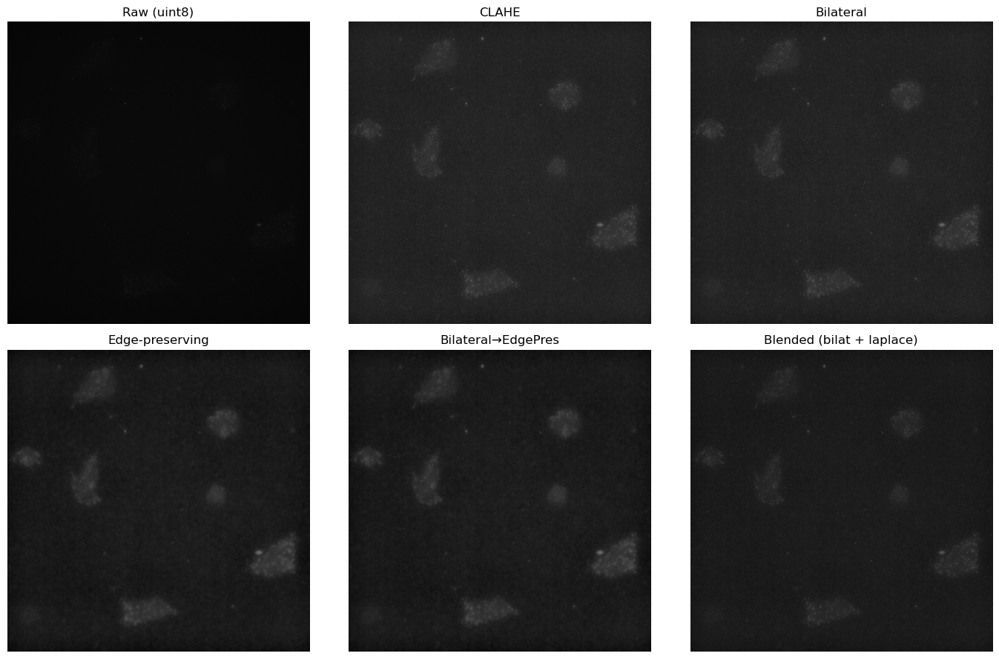

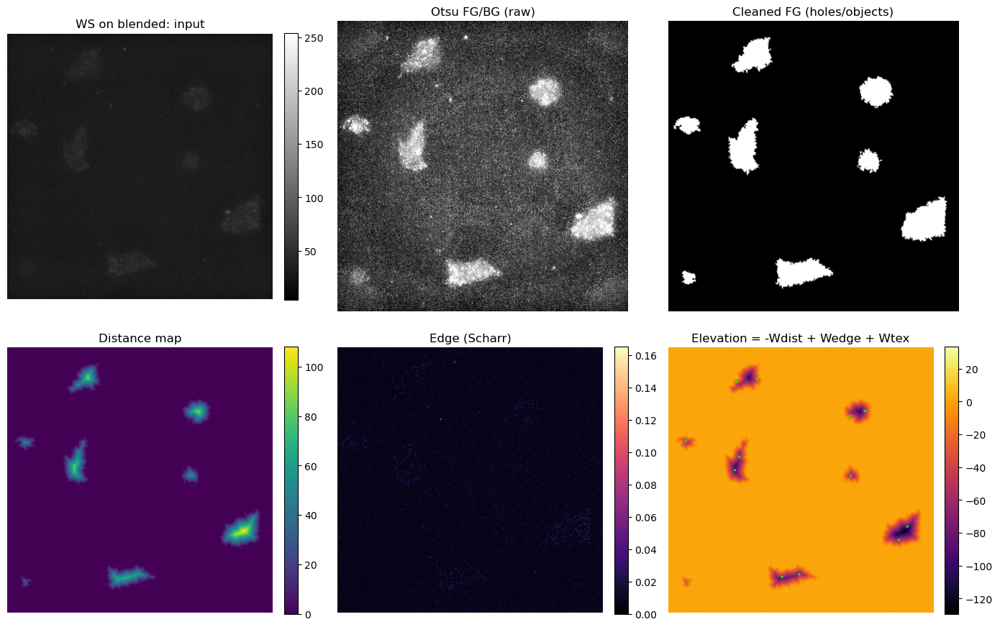

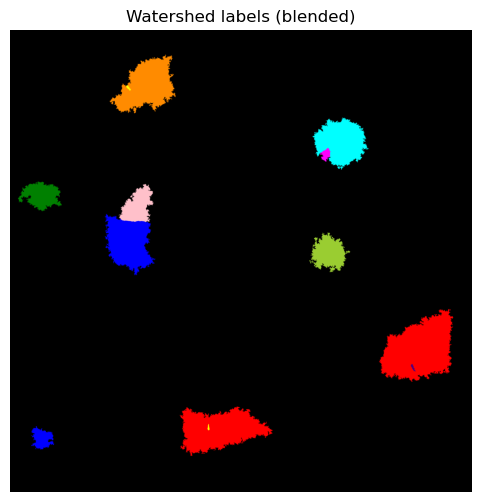

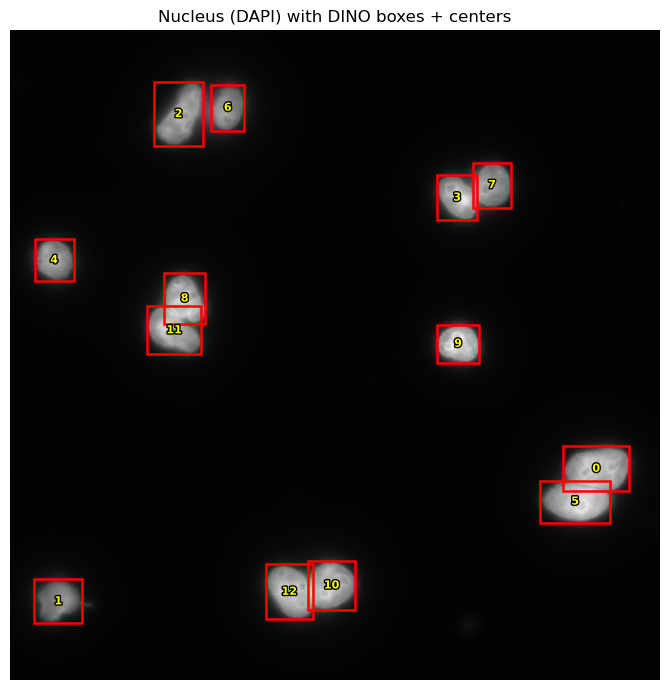

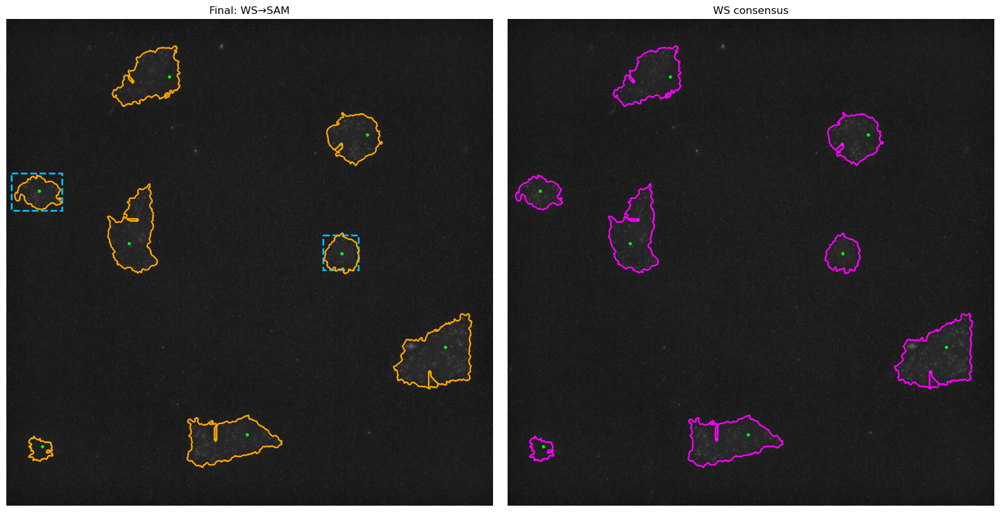

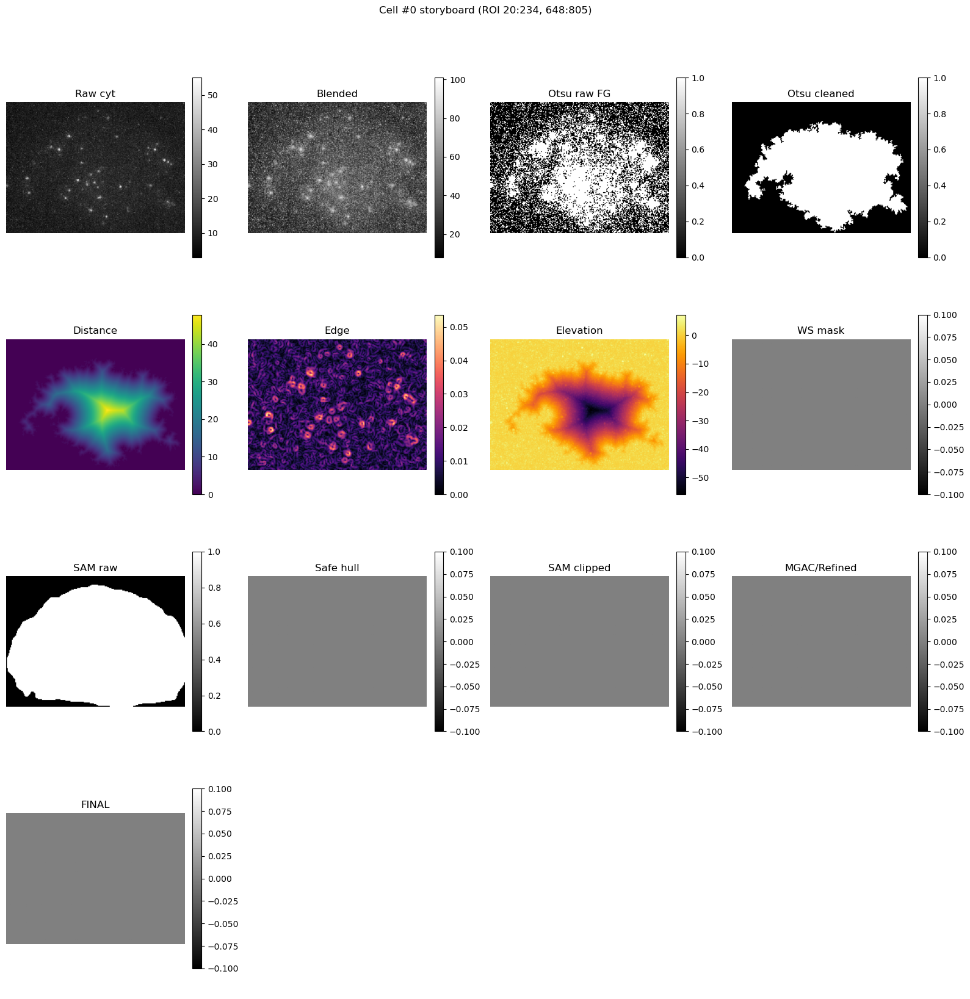

[WARN] Cell 5 has no bbox.


In [22]:
# ----------------------- Run -----------------------
if __name__ == "__main__":
    # Your Fish class (GroundingDINO + SAM)
    from fishCore import Fish

    # >>>>>> SET THESE <<<<<<
    CFG_PATH   = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\config.ini"                 # your config.ini
    MODEL_VER  = "3.50"                            # one of fish.supported_version
    CYT_PATH   = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\data_vadym_singletif_STACKED\MAX_EXP_w488_s0026.tif"      # 488 (cytoplasm)
    NUC_PATH   = r"C:\Users\tkpp2\Documents\FISH-ML\FISH-ML\assets\data_vadym_singletif_STACKED\MAX_EXP_wDAPI_s0026.tif"     # DAPI (nucleus)

    fish = Fish(config=pathlib.Path(CFG_PATH))
    fish.set_model_version(MODEL_VER)

    # Run processing with TWO paths
    res, dbg = process_image_debug_two_paths(CYT_PATH, NUC_PATH, fish)

    # Debug views
    show_params(dbg["params"])
    show_preprocessing(dbg["preproc"], res["cyt8"])
    show_ws_debug(dbg["preproc"]["blended"], dbg["ws_dbg"]["blended"], res["centers"],
                  title_prefix="WS on blended")
    show_ws_labels(dbg["labels"]["blended"], title="Watershed labels (blended)")
    show_nucleus_centers(res, dbg, title="Nucleus (DAPI) with DINO boxes + centers")
    show_ws_vs_final(res)
    # Checking overlapping cells and whats causing the issue
    show_cell_storyboard(idx=0, res=res, debug=dbg)
    show_cell_storyboard(idx=5, res=res, debug=dbg)